#### Libraries

In [1]:
# basic libraries

import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns

import unidecode
import re


import warnings

warnings.filterwarnings("ignore")  # category=DeprecationWarning


# Mise en page
import jupyter_black

jupyter_black.load()

In [2]:
# Set up path

PATH = os.path.join(os.getcwd(), "data")

#### Data preprocessing

In [3]:
# Load the data

# medium_main_page_datas
medium_main_page_datas = pd.read_csv(
    os.path.join(PATH, "2024-03-11_09h30_scrap global.csv")
)

# medium_detailed_page_datas data
medium_detailed_page_datas = pd.read_csv(
    os.path.join(PATH, "2024-03-13_20h26_detailed scrap.csv"),
    index_col=0,
)

In [4]:
medium_main_page_datas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15947 entries, 0 to 15946
Data columns (total 8 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Tag      15947 non-null  object
 1   year     15947 non-null  int64 
 2   month    15947 non-null  int64 
 3   claps    15947 non-null  int64 
 4   respond  15947 non-null  int64 
 5   title    15947 non-null  object
 6   authors  15947 non-null  object
 7   link     15947 non-null  object
dtypes: int64(4), object(4)
memory usage: 996.8+ KB


In [5]:
medium_detailed_page_datas.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15943 entries, 0 to 9
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   date          5172 non-null   object 
 1   categories    11898 non-null  object 
 2   title         14019 non-null  object 
 3   Claps         11132 non-null  float64
 4   Respond       2506 non-null   float64
 5   authors       3267 non-null   object 
 6   catch_phrase  15145 non-null  object 
 7   text          14073 non-null  object 
 8   link          15943 non-null  object 
dtypes: float64(2), object(7)
memory usage: 1.2+ MB


In [6]:
# Take a quick look on the datasets

display(medium_main_page_datas.head(5))
display(medium_detailed_page_datas.head(5))

,Tag,year,month,claps,respond,title,authors,link
0,conversational-ai,2024,1,30,0,New Features Agent Ai Chat Bot By I Need Leads...,Ineedleadsuk,https://medium.com/@ineedleadsuk/new-features-...
1,conversational-ai,2024,1,52,0,Pheme: An Efficient and Conversational Speech ...,Pankaj Trivedi,https://medium.com/@reachpankaj.trivedi/pheme-...
2,conversational-ai,2024,1,37,0,How to Transform Frontline Recruitment With an...,Juan Ben,https://medium.com/cloudapper-ai-for-ukg/how-t...
3,conversational-ai,2024,1,30,0,How to Handle High-Volume Frontline Hiring Wit...,Juan Ben,https://medium.com/cloudapper-ai-for-ukg/how-t...
4,conversational-ai,2024,1,435,0,MultiHop-RAG,Cobus Greyling,https://medium.com/@cobusgreyling/multihop-rag...


,date,categories,title,Claps,Respond,authors,catch_phrase,text,link
0,NaN,"Ai Chat Bot, Ai Chatbot, Conversational AI, Bu...",New Features Agent Ai Chat Bot By I Need Leads...,30.0,NaN,NaN,Sign up to discover human stories that deepen ...,"In this article, I will show you some of the ...",https://medium.com/@ineedleadsuk/new-features-...
1,3,"Artificial Intelligence, Conversational AI, Vo...",Pheme: An Efficient and Conversational Speech ...,52.0,3.0,NaN,Conversation models to the next level,Pheme is a series of efficient and conversati...,https://medium.com/@reachpankaj.trivedi/pheme-...
2,"Jan 31, 2024","Frontline Worker, Workforce Management, Ai In ...",How to Transform Frontline Recruitment With an...,37.0,NaN,CloudApper AI — Simplify AI/LLM Adoption for E...,Sign up to discover human stories that deepen ...,Think about it — who knows your company cultu...,https://medium.com/cloudapper-ai-for-ukg/how-t...
3,"Jan 31, 2024","Talent Acquisition, Workforce Management, Conv...",How to Handle High-Volume Frontline Hiring Wit...,30.0,NaN,CloudApper AI — Simplify AI/LLM Adoption for E...,Sign up to discover human stories that deepen ...,"So, why is there a constant need for an influ...",https://medium.com/cloudapper-ai-for-ukg/how-t...
4,3,"AI, Artificial Intelligence, Machine Learning,...",MultiHop-RAG,435.0,3.0,NaN,A recent direction in RAG architecture is esta...,Considering the development of the Large Lang...,https://medium.com/@cobusgreyling/multihop-rag...


In [7]:
medium_main_page_datas.drop_duplicates(inplace=True)
medium_detailed_page_datas.drop_duplicates(inplace=True)

#### which claps and responds are the good ones ?

In [8]:
def univ_cat(column, title):

    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    ax[0].bar(column.value_counts().index, column.value_counts())
    ax[0].set_title(title)
    ax[0].tick_params(axis="x", rotation=90)
    ax[1].pie(
        column.value_counts(), labels=column.value_counts().index, autopct="%1.1f%%"
    )
    ax[1].set_title(title)

    plt.tight_layout()
    plt.show()


def univ_num(column, title):
    fig, ax = plt.subplots(1, 2, figsize=(8, 3))
    ax[0].hist(column, bins=15, edgecolor="gray", color="skyblue")
    ax[0].set_title(title)
    ax[0].tick_params(axis="x", rotation=90)
    ax[1].boxplot(column)
    ax[1].set_title(title)

    plt.tight_layout()
    plt.show()

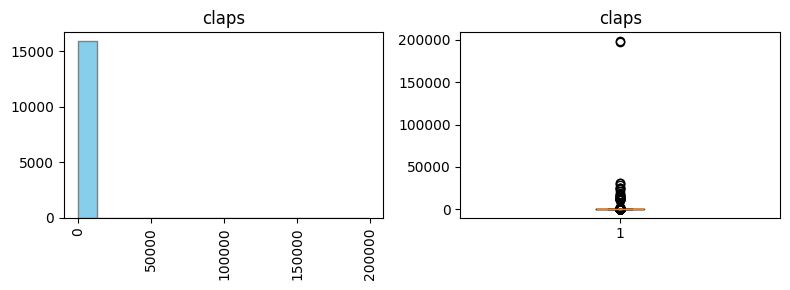

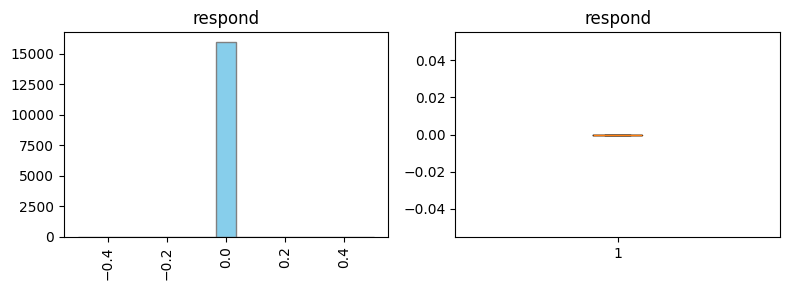

In [9]:
for i in ["claps", "respond"]:
    univ_num(medium_main_page_datas[[i]], i)

In [10]:
test_df = medium_detailed_page_datas.fillna(0)

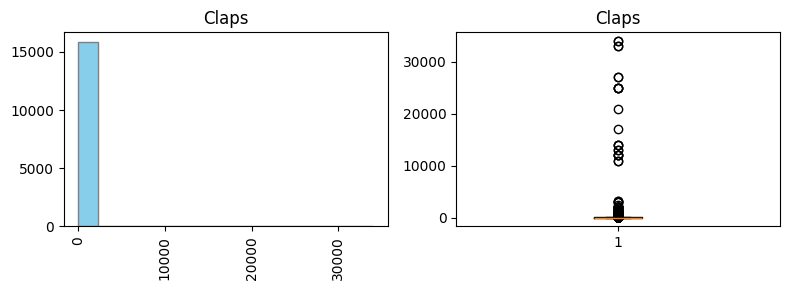

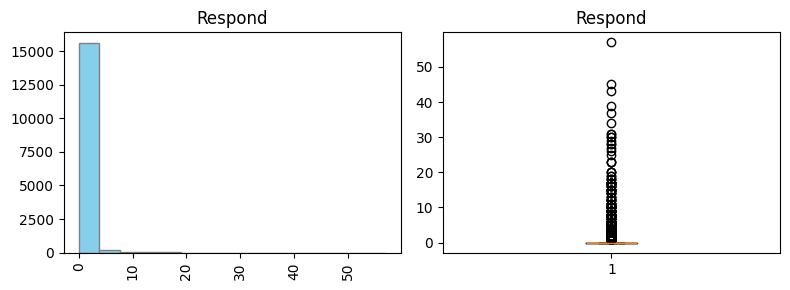

In [11]:
for i in ["Claps", "Respond"]:
    univ_num(test_df[[i]], i)

### Merging them and have a quick look on the dataset

In [12]:
# Merging them and have a quick look on the dataset

df_merged = medium_main_page_datas.copy()
df_merged = df_merged.merge(medium_detailed_page_datas, how="inner", on="link")
df_merged.head(5)

,Tag,year,month,claps,respond,title_x,authors_x,link,date,categories,title_y,Claps,Respond,authors_y,catch_phrase,text
0,conversational-ai,2024,1,30,0,New Features Agent Ai Chat Bot By I Need Leads...,Ineedleadsuk,https://medium.com/@ineedleadsuk/new-features-...,NaN,"Ai Chat Bot, Ai Chatbot, Conversational AI, Bu...",New Features Agent Ai Chat Bot By I Need Leads...,30.0,NaN,NaN,Sign up to discover human stories that deepen ...,"In this article, I will show you some of the ..."
1,conversational-ai,2024,1,52,0,Pheme: An Efficient and Conversational Speech ...,Pankaj Trivedi,https://medium.com/@reachpankaj.trivedi/pheme-...,3,"Artificial Intelligence, Conversational AI, Vo...",Pheme: An Efficient and Conversational Speech ...,52.0,3.0,NaN,Conversation models to the next level,Pheme is a series of efficient and conversati...
2,conversational-ai,2024,1,37,0,How to Transform Frontline Recruitment With an...,Juan Ben,https://medium.com/cloudapper-ai-for-ukg/how-t...,"Jan 31, 2024","Frontline Worker, Workforce Management, Ai In ...",How to Transform Frontline Recruitment With an...,37.0,NaN,CloudApper AI — Simplify AI/LLM Adoption for E...,Sign up to discover human stories that deepen ...,Think about it — who knows your company cultu...
3,conversational-ai,2024,1,30,0,How to Handle High-Volume Frontline Hiring Wit...,Juan Ben,https://medium.com/cloudapper-ai-for-ukg/how-t...,"Jan 31, 2024","Talent Acquisition, Workforce Management, Conv...",How to Handle High-Volume Frontline Hiring Wit...,30.0,NaN,CloudApper AI — Simplify AI/LLM Adoption for E...,Sign up to discover human stories that deepen ...,"So, why is there a constant need for an influ..."
4,conversational-ai,2024,1,435,0,MultiHop-RAG,Cobus Greyling,https://medium.com/@cobusgreyling/multihop-rag...,3,"AI, Artificial Intelligence, Machine Learning,...",MultiHop-RAG,435.0,3.0,NaN,A recent direction in RAG architecture is esta...,Considering the development of the Large Lang...


In [13]:
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15940 entries, 0 to 15939
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Tag           15940 non-null  object 
 1   year          15940 non-null  int64  
 2   month         15940 non-null  int64  
 3   claps         15940 non-null  int64  
 4   respond       15940 non-null  int64  
 5   title_x       15940 non-null  object 
 6   authors_x     15940 non-null  object 
 7   link          15940 non-null  object 
 8   date          5172 non-null   object 
 9   categories    11895 non-null  object 
 10  title_y       14016 non-null  object 
 11  Claps         11130 non-null  float64
 12  Respond       2506 non-null   float64
 13  authors_y     3268 non-null   object 
 14  catch_phrase  15142 non-null  object 
 15  text          14071 non-null  object 
dtypes: float64(2), int64(4), object(10)
memory usage: 1.9+ MB


In [14]:
df_merged.describe()

,year,month,claps,respond,Claps,Respond
count,15940.0,15940.000000,15940.000000,15940.0,11130.000000,2506.000000
mean,2024.0,1.502760,82.945107,0.0,114.916083,2.248204
std,0.0,0.500008,2344.864138,0.0,997.883404,3.651135
min,2024.0,1.000000,0.000000,0.0,1.000000,1.000000
25%,2024.0,1.000000,0.000000,0.0,7.000000,1.000000
50%,2024.0,2.000000,2.000000,0.0,36.000000,1.000000
75%,2024.0,2.000000,34.000000,0.0,74.000000,2.000000
max,2024.0,2.000000,199000.000000,0.0,34000.000000,57.000000


In [15]:
df_merged.describe(include=["O"])

,Tag,title_x,authors_x,link,date,categories,title_y,authors_y,catch_phrase,text
count,15940,15940,15940,15940,5172,11895,14016,3268,15142,14071
unique,12,12164,6643,15911,182,8745,11713,1195,5029,11840
top,data-science,Khiwasara Rupee Loan CusTomer Care Helpline Nu...,Monodeep Mukherjee,https://medium.com/datadriveninvestor/introduc...,1,"Technology, Artificial Intelligence, Machine L...",Machine Learning: Zero to Hero,Follow,Sign up to discover human stories that deepen ...,Author : Abstract :
freq,2599,285,1319,4,1079,1007,12,305,7522,24


In [16]:
# Quick cleaning for the scrapping that haven't succeeded, or to drop the tag we are not happy with (on a second thought)

In [17]:
df_merged["catch_phrase"].value_counts()

catch_phrase
Sign up to discover human stories that deepen your understanding of the world.    7522
Create an account to read the full story.                                         1096
Introduction                                                                       189
Introduction:                                                                       26
Recommended Analysis                                                                17
                                                                                  ... 
Agents | 🦜️🔗 Langchain                                                               1
Case Study                                                                           1
Multi-Head Attention                                                                 1
Data preprocessing                                                                   1
1. Klausa SELECT                                                                     1
Name: count, Length: 5029, dty

In [18]:
df_merged.loc[0, "catch_phrase"]

'Sign up to discover human stories that deepen your understanding of the world.'

In [19]:
def clean_catch_phrase(text):
    if (
        text
        == "Sign up to discover human stories that deepen your understanding of the world."
        or text == "Create an account to read the full story."
    ):
        text = "0"
    return text


df_merged["catch_phrase"] = df_merged["catch_phrase"].apply(
    lambda x: clean_catch_phrase(x)
)

In [20]:
df_merged[df_merged["catch_phrase"] == "0"]

,Tag,year,month,claps,respond,title_x,authors_x,link,date,categories,title_y,Claps,Respond,authors_y,catch_phrase,text
0,conversational-ai,2024,1,30,0,New Features Agent Ai Chat Bot By I Need Leads...,Ineedleadsuk,https://medium.com/@ineedleadsuk/new-features-...,NaN,"Ai Chat Bot, Ai Chatbot, Conversational AI, Bu...",New Features Agent Ai Chat Bot By I Need Leads...,30.0,NaN,NaN,0,"In this article, I will show you some of the ..."
2,conversational-ai,2024,1,37,0,How to Transform Frontline Recruitment With an...,Juan Ben,https://medium.com/cloudapper-ai-for-ukg/how-t...,"Jan 31, 2024","Frontline Worker, Workforce Management, Ai In ...",How to Transform Frontline Recruitment With an...,37.0,NaN,CloudApper AI — Simplify AI/LLM Adoption for E...,0,Think about it — who knows your company cultu...
3,conversational-ai,2024,1,30,0,How to Handle High-Volume Frontline Hiring Wit...,Juan Ben,https://medium.com/cloudapper-ai-for-ukg/how-t...,"Jan 31, 2024","Talent Acquisition, Workforce Management, Conv...",How to Handle High-Volume Frontline Hiring Wit...,30.0,NaN,CloudApper AI — Simplify AI/LLM Adoption for E...,0,"So, why is there a constant need for an influ..."
8,conversational-ai,2024,1,10,0,Demystifying Conversation: An Introduction to ...,Vaibhavi,https://medium.com/@kvaibz/demystifying-conver...,1,"UX, Conversational AI",Demystifying Conversation: An Introduction to ...,10.0,1.0,NaN,0,Conversational UX is the art and science of d...
9,conversational-ai,2024,1,0,0,Frontline Employees Jumping Ship? Use AI To Pr...,Juan Ben,https://medium.com/cloudapper-ai-for-ukg/front...,"Jan 30, 2024","Ai In Business, Workforce Management, Conversa...",Frontline Employees Jumping Ship? Use AI To Pr...,NaN,NaN,CloudApper AI — Simplify AI/LLM Adoption for E...,0,Frontline retention isn’t just a nice-to-have...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15932,sql,2024,2,0,0,.Net MVC -SQL Questions,Ronak Munjapara,https://medium.com/@munjapararonak1/net-mvc-sq...,NaN,"Mvc, Dotnet Core, Dotnet, Sql Server, Sql",.Net MVC -SQL Questions,NaN,NaN,NaN,0,"Difference between TempData, ViewData, ViewBa..."
15933,sql,2024,2,24,0,Data Engineer: PostgreSQL Best Practice,Prem Vishnoi(cloudvala),https://medium.com/@premvishnoi/data-engineer-...,1,"Postgresql, Sql, Data Engineer, Data, Security",Data Engineer: PostgreSQL Best Practice,24.0,1.0,NaN,0,"When working with PostgreSQL, adhering to cer..."
15934,sql,2024,2,1,0,SQL Triggers: All You Need to Know in Under 5 ...,DbVisualizer,https://medium.com/the-table-sql-and-devtalk/s...,"Feb 1, 2024","Triggers, Sql",Decoding SQL Triggers: A Developer’s Guide,1.0,NaN,The Table /* SQL and devtalk */,0,"Triggers can be row-level, executing once per..."
15937,sql,2024,2,0,0,[工作筆記] ElasticSearch 的 SQL API,簡嘉炫 Po Jian,https://medium.com/@tses89214/%E5%B7%A5%E4%BD%...,"POST _sql?format=txt\n{\n ""query"": """"""\n SEL...","Sql, Elasticsearch, Engineering",[工作筆記] ElasticSearch 的 SQL API,NaN,NaN,NaN,0,建議使用單引號 ‘ 來標示一般字串，使用雙引號 “ 來標示欄位，若沒有標示正確可能會得到 ...


In [21]:
tags = [
    # "conversational-ai",
    # "deep-learning",
    # "large-language-models",
    # "machine-learning",
    # "nlp",
    # "voice-assistant",
    "blockchain",
    "bitcoin",
    "cryptocurrency",
    "decentralized-finance",
    "ethereum",
    "nft",
    "web3",
    # "data-science",
    # "analytics",
    # "data-engineering",
    # "data-visualization",
    # "database-design",
    # "sql",
]

In [22]:
for e in tags:
    df_merged = df_merged[df_merged["Tag"] != e]
df_merged

,Tag,year,month,claps,respond,title_x,authors_x,link,date,categories,title_y,Claps,Respond,authors_y,catch_phrase,text
0,conversational-ai,2024,1,30,0,New Features Agent Ai Chat Bot By I Need Leads...,Ineedleadsuk,https://medium.com/@ineedleadsuk/new-features-...,NaN,"Ai Chat Bot, Ai Chatbot, Conversational AI, Bu...",New Features Agent Ai Chat Bot By I Need Leads...,30.0,NaN,NaN,0,"In this article, I will show you some of the ..."
1,conversational-ai,2024,1,52,0,Pheme: An Efficient and Conversational Speech ...,Pankaj Trivedi,https://medium.com/@reachpankaj.trivedi/pheme-...,3,"Artificial Intelligence, Conversational AI, Vo...",Pheme: An Efficient and Conversational Speech ...,52.0,3.0,NaN,Conversation models to the next level,Pheme is a series of efficient and conversati...
2,conversational-ai,2024,1,37,0,How to Transform Frontline Recruitment With an...,Juan Ben,https://medium.com/cloudapper-ai-for-ukg/how-t...,"Jan 31, 2024","Frontline Worker, Workforce Management, Ai In ...",How to Transform Frontline Recruitment With an...,37.0,NaN,CloudApper AI — Simplify AI/LLM Adoption for E...,0,Think about it — who knows your company cultu...
3,conversational-ai,2024,1,30,0,How to Handle High-Volume Frontline Hiring Wit...,Juan Ben,https://medium.com/cloudapper-ai-for-ukg/how-t...,"Jan 31, 2024","Talent Acquisition, Workforce Management, Conv...",How to Handle High-Volume Frontline Hiring Wit...,30.0,NaN,CloudApper AI — Simplify AI/LLM Adoption for E...,0,"So, why is there a constant need for an influ..."
4,conversational-ai,2024,1,435,0,MultiHop-RAG,Cobus Greyling,https://medium.com/@cobusgreyling/multihop-rag...,3,"AI, Artificial Intelligence, Machine Learning,...",MultiHop-RAG,435.0,3.0,NaN,A recent direction in RAG architecture is esta...,Considering the development of the Large Lang...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15935,sql,2024,2,55,0,Creating Databases with SQL Server: A Beginner...,"Mustafa Germec, PhD",https://medium.com/ai-mind-labs/creating-datab...,"Feb 1, 2024",NaN,Creating Databases with SQL Server: A Beginner...,55.0,NaN,NaN,A Message from AI Mind,My previous article was about connecting to S...
15936,sql,2024,2,0,0,Designing a Data Model for a Ride-Sharing App:...,Vishal Barvaliya,https://medium.com/@vishalbarvaliya/designing-...,NaN,NaN,Designing a Data Model for a Ride-Sharing App:...,252.0,NaN,NaN,Entities:,First of all let’s decide how many fact and d...
15937,sql,2024,2,0,0,[工作筆記] ElasticSearch 的 SQL API,簡嘉炫 Po Jian,https://medium.com/@tses89214/%E5%B7%A5%E4%BD%...,"POST _sql?format=txt\n{\n ""query"": """"""\n SEL...","Sql, Elasticsearch, Engineering",[工作筆記] ElasticSearch 的 SQL API,NaN,NaN,NaN,0,建議使用單引號 ‘ 來標示一般字串，使用雙引號 “ 來標示欄位，若沒有標示正確可能會得到 ...
15938,sql,2024,2,0,0,SQL Data Cleaning for Handling Missing Values ...,SQL Fundamentals,https://medium.com/@sqlfundamentals/sql-data-c...,1,NaN,SQL Data Cleaning for Handling Missing Values ...,119.0,1.0,NaN,Conclusion,Data cleaning is a critical step in the data ...


In [23]:
# Drop the useless column

df_merged.columns

Index(['Tag', 'year', 'month', 'claps', 'respond', 'title_x', 'authors_x',
       'link', 'date', 'categories', 'title_y', 'Claps', 'Respond',
       'authors_y', 'catch_phrase', 'text'],
      dtype='object')

In [24]:
df_merged.drop(
    columns=["claps", "respond", "date", "title_y", "authors_y"],  # , "catch_phrase"],
    axis=1,
    inplace=True,
)

In [25]:
# Normalize column names
df_merged.columns

Index(['Tag', 'year', 'month', 'title_x', 'authors_x', 'link', 'categories',
       'Claps', 'Respond', 'catch_phrase', 'text'],
      dtype='object')

In [26]:
df_merged_col = [
    "tag",
    "year",
    "month",
    "title",
    "authors",
    "link",
    "categories",
    "claps",
    "responds",
    "catch_phrase",
    "text",
]

df_merged.columns = df_merged_col
display(df_merged.columns)

Index(['tag', 'year', 'month', 'title', 'authors', 'link', 'categories',
       'claps', 'responds', 'catch_phrase', 'text'],
      dtype='object')

In [27]:
# Fill the NA and drop NA depending on the relevancy of the missing values

df_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15940 entries, 0 to 15939
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   tag           15940 non-null  object 
 1   year          15940 non-null  int64  
 2   month         15940 non-null  int64  
 3   title         15940 non-null  object 
 4   authors       15940 non-null  object 
 5   link          15940 non-null  object 
 6   categories    11895 non-null  object 
 7   claps         11130 non-null  float64
 8   responds      2506 non-null   float64
 9   catch_phrase  15142 non-null  object 
 10  text          14071 non-null  object 
dtypes: float64(2), int64(2), object(7)
memory usage: 1.3+ MB


In [28]:
for c in df_merged.columns:
    if df_merged[c].dtype in ["float64", "int64"]:
        print(c)
        df_merged[c] = df_merged[c].fillna(value=0)
    else:
        df_merged[c] = df_merged[c].fillna(value="0")

year
month
claps
responds


In [29]:
df_merged["categories"][df_merged["categories"] == "0"] = np.nan

In [30]:
df_merged[
    (df_merged["title"] == "0")
    & (df_merged["catch_phrase"] == "0")
    & (df_merged["text"] == "0")
] = np.nan

In [31]:
df_merged = df_merged.dropna()

In [32]:
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11895 entries, 0 to 15939
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   tag           11895 non-null  object 
 1   year          11895 non-null  int64  
 2   month         11895 non-null  int64  
 3   title         11895 non-null  object 
 4   authors       11895 non-null  object 
 5   link          11895 non-null  object 
 6   categories    11895 non-null  object 
 7   claps         11895 non-null  float64
 8   responds      11895 non-null  float64
 9   catch_phrase  11895 non-null  object 
 10  text          11895 non-null  object 
dtypes: float64(2), int64(2), object(7)
memory usage: 1.1+ MB


In [33]:
# Changing the type of columns

In [34]:
quant_cols = ["claps", "responds"]

cat_cols = ["tag", "year", "month", "authors", "categories"]

In [35]:
for c in df_merged.columns:
    if c in cat_cols:
        df_merged[[c]] = df_merged[[c]].astype("category")

df_merged.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11895 entries, 0 to 15939
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   tag           11895 non-null  category
 1   year          11895 non-null  category
 2   month         11895 non-null  category
 3   title         11895 non-null  object  
 4   authors       11895 non-null  category
 5   link          11895 non-null  object  
 6   categories    11895 non-null  category
 7   claps         11895 non-null  float64 
 8   responds      11895 non-null  float64 
 9   catch_phrase  11895 non-null  object  
 10  text          11895 non-null  object  
dtypes: category(5), float64(2), object(4)
memory usage: 1.2+ MB


In [36]:
df_merged.reset_index(drop=True, inplace=True)
df_merged

,tag,year,month,title,authors,link,categories,claps,responds,catch_phrase,text
0,conversational-ai,2024,1,New Features Agent Ai Chat Bot By I Need Leads...,Ineedleadsuk,https://medium.com/@ineedleadsuk/new-features-...,"Ai Chat Bot, Ai Chatbot, Conversational AI, Bu...",30.0,0.0,0,"In this article, I will show you some of the ..."
1,conversational-ai,2024,1,Pheme: An Efficient and Conversational Speech ...,Pankaj Trivedi,https://medium.com/@reachpankaj.trivedi/pheme-...,"Artificial Intelligence, Conversational AI, Vo...",52.0,3.0,Conversation models to the next level,Pheme is a series of efficient and conversati...
2,conversational-ai,2024,1,How to Transform Frontline Recruitment With an...,Juan Ben,https://medium.com/cloudapper-ai-for-ukg/how-t...,"Frontline Worker, Workforce Management, Ai In ...",37.0,0.0,0,Think about it — who knows your company cultu...
3,conversational-ai,2024,1,How to Handle High-Volume Frontline Hiring Wit...,Juan Ben,https://medium.com/cloudapper-ai-for-ukg/how-t...,"Talent Acquisition, Workforce Management, Conv...",30.0,0.0,0,"So, why is there a constant need for an influ..."
4,conversational-ai,2024,1,MultiHop-RAG,Cobus Greyling,https://medium.com/@cobusgreyling/multihop-rag...,"AI, Artificial Intelligence, Machine Learning,...",435.0,3.0,A recent direction in RAG architecture is esta...,Considering the development of the Large Lang...
...,...,...,...,...,...,...,...,...,...,...,...
11890,sql,2024,2,.Net MVC -SQL Questions,Ronak Munjapara,https://medium.com/@munjapararonak1/net-mvc-sq...,"Mvc, Dotnet Core, Dotnet, Sql Server, Sql",0.0,0.0,0,"Difference between TempData, ViewData, ViewBa..."
11891,sql,2024,2,Data Engineer: PostgreSQL Best Practice,Prem Vishnoi(cloudvala),https://medium.com/@premvishnoi/data-engineer-...,"Postgresql, Sql, Data Engineer, Data, Security",24.0,1.0,0,"When working with PostgreSQL, adhering to cer..."
11892,sql,2024,2,SQL Triggers: All You Need to Know in Under 5 ...,DbVisualizer,https://medium.com/the-table-sql-and-devtalk/s...,"Triggers, Sql",1.0,0.0,0,"Triggers can be row-level, executing once per..."
11893,sql,2024,2,[工作筆記] ElasticSearch 的 SQL API,簡嘉炫 Po Jian,https://medium.com/@tses89214/%E5%B7%A5%E4%BD%...,"Sql, Elasticsearch, Engineering",0.0,0.0,0,建議使用單引號 ‘ 來標示一般字串，使用雙引號 “ 來標示欄位，若沒有標示正確可能會得到 ...


# EDA

## Univariate analysis

In [37]:
def univ_cat(column, title):

    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    ax[0].bar(column.value_counts().index, column.value_counts())
    ax[0].set_title(title)
    ax[0].tick_params(axis="x", rotation=90)
    ax[1].pie(
        column.value_counts(), labels=column.value_counts().index, autopct="%1.1f%%"
    )
    ax[1].set_title(title)

    plt.tight_layout()
    plt.show()


def univ_num(column, title):
    fig, ax = plt.subplots(1, 2, figsize=(8, 3))
    ax[0].hist(column, bins=15, edgecolor="gray", color="skyblue")
    ax[0].set_title(title)
    ax[0].tick_params(axis="x", rotation=90)
    ax[1].boxplot(column)
    ax[1].set_title(title)

    plt.tight_layout()
    plt.show()

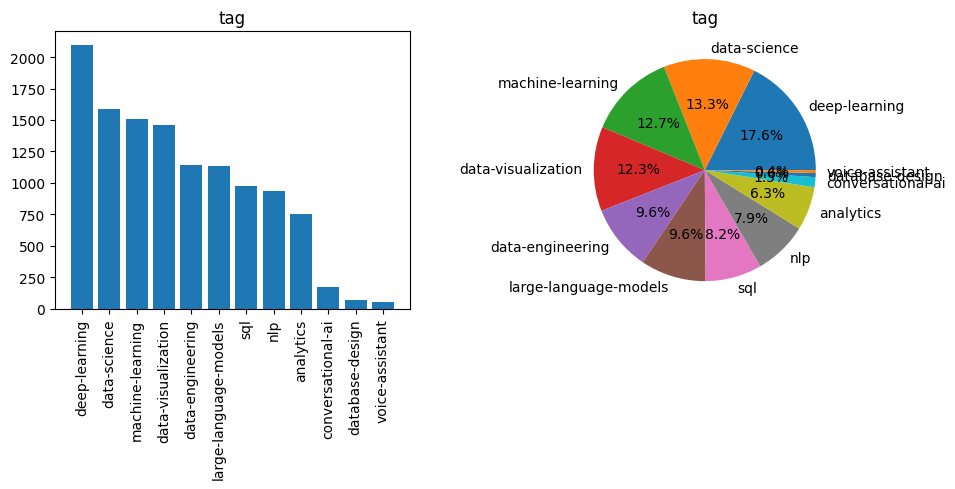

'Now, value_counts() for tag:'

tag
deep-learning            2099
data-science             1587
machine-learning         1511
data-visualization       1461
data-engineering         1141
large-language-models    1136
sql                       977
nlp                       935
analytics                 753
conversational-ai         175
database-design            69
voice-assistant            51
Name: count, dtype: int64

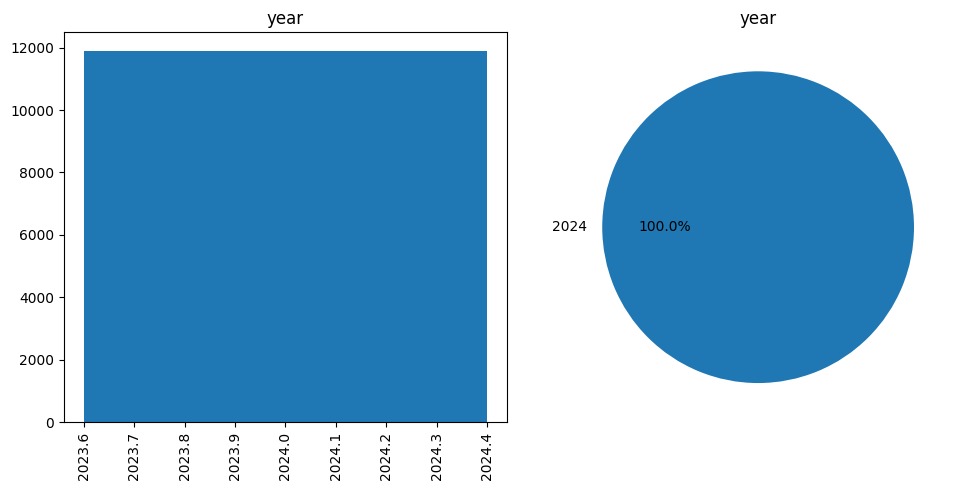

'Now, value_counts() for year:'

year
2024    11895
Name: count, dtype: int64

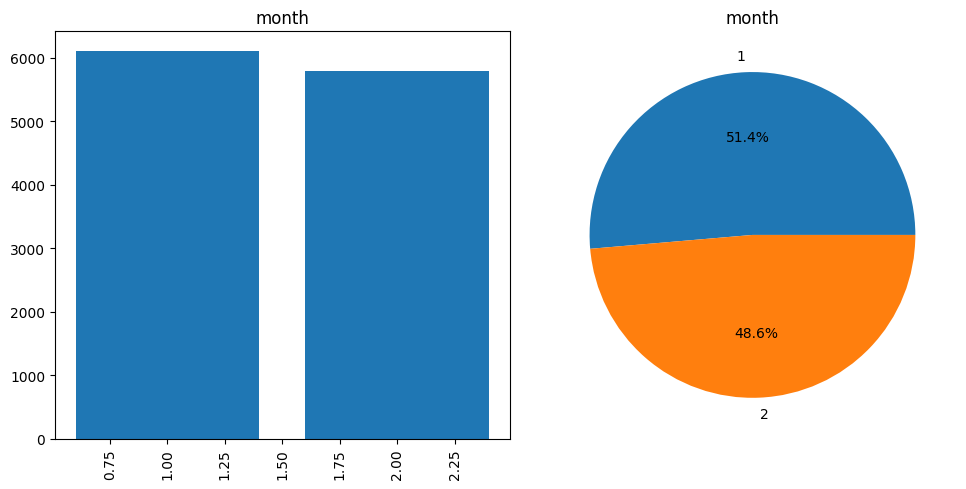

'Now, value_counts() for month:'

month
1    6109
2    5786
Name: count, dtype: int64

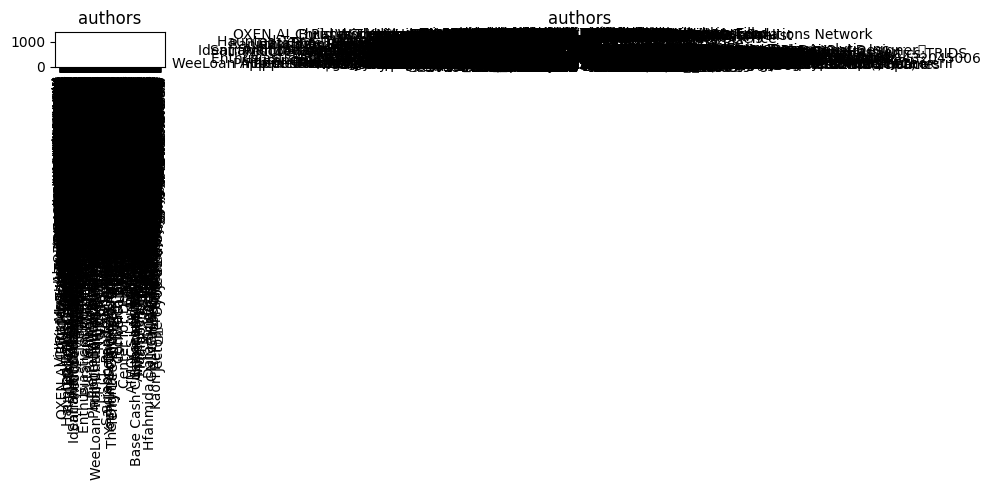

'Now, value_counts() for authors:'

authors
Monodeep Mukherjee      1317
Cobus Greyling            76
Geetanjali Kumari         47
Pleasing Brook            45
Ritvik Rastogi            38
                        ... 
Jelle van Kerkvoorde       1
Jelly (Reimagined)         1
Jen Ambrose                1
Jennifer Wanjiru           1
Lux Li                     1
Name: count, Length: 5565, dtype: int64

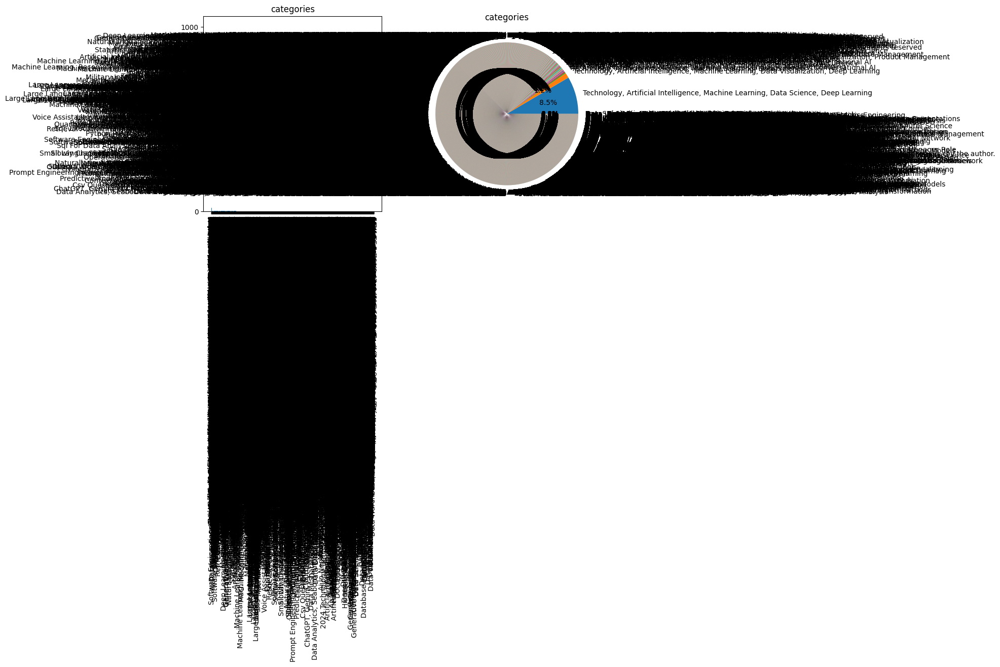

'Now, value_counts() for categories:'

categories
Technology, Artificial Intelligence, Machine Learning, Data Science, Deep Learning          1007
Technology, Artificial Intelligence, Machine Learning, Data Visualization, Deep Learning     139
Technology, Artificial Intelligence, Machine Learning, Data Science                           28
AI, Artificial Intelligence, Machine Learning, Large Language Models, Conversational AI       27
Data Science, Self Improvement, Programming, Technology, Machine Learning                     25
                                                                                            ... 
Data, Business Value, Analytics, AI                                                            1
Data, Big Data, Data Engineering, Data Ingestion, Etl                                          1
Data, Big Data, Data Analysis, Analytics, Business                                             1
Data, Bias, Bias In Data, Analytics                                                            1
Ｍac, Sql Server, Sq

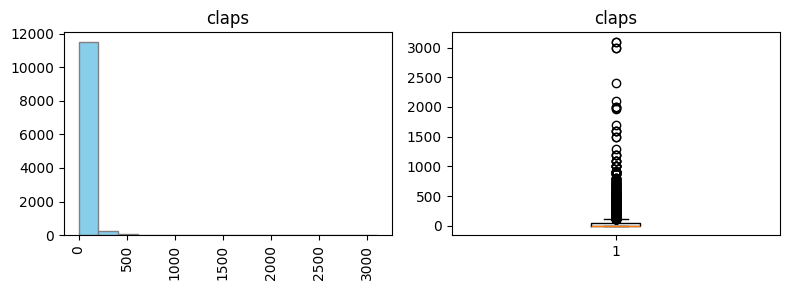

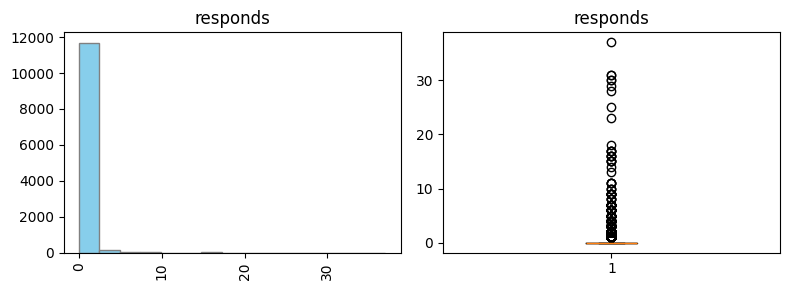

In [38]:
for i, column in enumerate(list(df_merged.columns)):

    if column in quant_cols:
        univ_num(df_merged[column], column)

    if column in cat_cols:
        univ_cat(df_merged[column], column)
        display("Now, value_counts() for " + column + ":")
        display(df_merged[column].value_counts())

In [39]:
## Quick cleaning of the datas

In [40]:
df_merged.drop(columns=["year"], inplace=True)  # because we have only 2024

In [41]:
"""
with pd.option_context("display.max_colwidth", 1000):
    print(
        medium_detailed_page_datas[medium_detailed_page_datas["claps"] > 100000]["link"]
    )
"""

'\nwith pd.option_context("display.max_colwidth", 1000):\n    print(\n        medium_detailed_page_datas[medium_detailed_page_datas["claps"] > 100000]["link"]\n    )\n'

In [42]:
df_merged = df_merged[df_merged["claps"] > 2]

In [43]:
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7165 entries, 0 to 11891
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   tag           7165 non-null   category
 1   month         7165 non-null   category
 2   title         7165 non-null   object  
 3   authors       7165 non-null   category
 4   link          7165 non-null   object  
 5   categories    7165 non-null   category
 6   claps         7165 non-null   float64 
 7   responds      7165 non-null   float64 
 8   catch_phrase  7165 non-null   object  
 9   text          7165 non-null   object  
dtypes: category(4), float64(2), object(4)
memory usage: 933.2+ KB


In [44]:
# Filter rows where the "text" column is in English

import nltk

nltk.download("words")


# Function to check if text is in English
def is_english(text):
    english_words = set(nltk.corpus.words.words())
    words = text.split()
    english_word_count = sum(1 for word in words if word.lower() in english_words)
    return (
        english_word_count / len(words) <= 0.5
    )  # Consider the text as English if more than half of the words are English


df_not_english = df_merged.copy()

# Filter rows where the "text" column is in English
df_not_english = df_not_english[df_not_english["text"].apply(is_english)]

df_not_english

[nltk_data] Downloading package words to
[nltk_data]     C:\Users\romai\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


,tag,month,title,authors,link,categories,claps,responds,catch_phrase,text
54,conversational-ai,1,Kendi ChatGPT’nizi Yapın,Ahmet Onur,https://medium.com/@m.ahmetonur01/kendi-chatgp...,"Gpt, Langchain, Streamlit, Large Language Mode...",56.0,0.0,0,Peki bu tablodaki ücretler ne anlama geliyor;...
71,conversational-ai,1,How to Use Conversational AI to Build Relation...,Mike Szczesny EDCO,https://medium.com/@mikeszczesny.edco/how-to-u...,"Conversational AI, Customer Relations",10.0,0.0,0,0
87,conversational-ai,1,Generative AI UX Pattern: (2)Citation,Juhee Go,https://medium.com/skelterlabs-designer/genera...,"AI, UX, Generative Ai, Ux Pattern, Conversatio...",207.0,0.0,Citation 패턴이란?,환각 현상 : AI(인공지능)가 맥락과 관련없거나 사실이 아닌 내용을 마치 옳은 ...
235,deep-learning,1,Watch A.I. Build the Game of Flappy Bird with ...,Josh Olin,https://medium.com/@JD_2020/watch-a-i-build-th...,"Artificial Intelligence, Coding, Deep Learning",4.0,0.0,0,0
258,deep-learning,1,OpenVino (1 Min) Introduction,Ahsan Raza,https://medium.com/@ahsaanraazaa/openvino-1-mi...,"Computer Vision, Openvino, Object Detection, D...",19.0,0.0,0,0
...,...,...,...,...,...,...,...,...,...,...
11757,sql,2,25 SQL Sorgu Alıştırması,Yasemin Derya Dilli,https://medium.com/@yaseminderyadilli/25-sql-s...,"Sql, Sql Queries, Data Analysis, Data Science,...",96.0,0.0,Sorgu 1,Doğum yılı 1990 ve 1995 arasında olan müşteri...
11776,sql,2,MER (Modelo Entidade Relacionamento)e DER (Dia...,Francisco Mota,https://medium.com/@soares.mota.ch/mer-modelo-...,"Data Engineering, Data, Emr, Python, Sql",37.0,0.0,Modelagem conceitual,É hora do conceito… A modelagem conceitual é ...
11791,sql,2,빅쿼리 Nested 칼럼을 CROSS JOIN으로 접근하면 데이터 분석을 망칩니다.,Joshua Kim,https://medium.com/iotrustlab/bigquery-nested-...,"빅쿼리, Sql, Nested Columns, 쿼리, 데이터분석",22.0,0.0,1. Nested Columns,"본 아티클에서는 Nested Repeated 칼럼 유형의 정확한 의미, 그리고 C..."
11805,sql,2,MacOS içerisinde Docker ile MsSQL Server Kulla...,İbrahim Halıcı,https://medium.com/@ibrahim-halici/macos-i%C3%...,"Veritabanı, Sql, Docker, Macos",56.0,0.0,Restore a SQL Server database in a Linux conta...,2 — Docker 3 — Veri Tabanı Yedek Dosyası 1. D...


In [45]:
# Filter rows where the "text" column is in English

import nltk

nltk.download("words")


# Function to check if text is in English
def is_english(text):
    english_words = set(nltk.corpus.words.words())
    words = text.split()
    english_word_count = sum(1 for word in words if word.lower() in english_words)
    return (
        english_word_count / len(words) > 0.5
    )  # Consider the text as English if more than half of the words are English


df_english = df_merged.copy()

# Filter rows where the "text" column is in English
df_english = df_english[df_english["text"].apply(is_english)]

df_english

[nltk_data] Downloading package words to
[nltk_data]     C:\Users\romai\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


,tag,month,title,authors,link,categories,claps,responds,catch_phrase,text
0,conversational-ai,1,New Features Agent Ai Chat Bot By I Need Leads...,Ineedleadsuk,https://medium.com/@ineedleadsuk/new-features-...,"Ai Chat Bot, Ai Chatbot, Conversational AI, Bu...",30.0,0.0,0,"In this article, I will show you some of the ..."
1,conversational-ai,1,Pheme: An Efficient and Conversational Speech ...,Pankaj Trivedi,https://medium.com/@reachpankaj.trivedi/pheme-...,"Artificial Intelligence, Conversational AI, Vo...",52.0,3.0,Conversation models to the next level,Pheme is a series of efficient and conversati...
2,conversational-ai,1,How to Transform Frontline Recruitment With an...,Juan Ben,https://medium.com/cloudapper-ai-for-ukg/how-t...,"Frontline Worker, Workforce Management, Ai In ...",37.0,0.0,0,Think about it — who knows your company cultu...
3,conversational-ai,1,How to Handle High-Volume Frontline Hiring Wit...,Juan Ben,https://medium.com/cloudapper-ai-for-ukg/how-t...,"Talent Acquisition, Workforce Management, Conv...",30.0,0.0,0,"So, why is there a constant need for an influ..."
4,conversational-ai,1,MultiHop-RAG,Cobus Greyling,https://medium.com/@cobusgreyling/multihop-rag...,"AI, Artificial Intelligence, Machine Learning,...",435.0,3.0,A recent direction in RAG architecture is esta...,Considering the development of the Large Lang...
...,...,...,...,...,...,...,...,...,...,...
11879,sql,2,8 Macro Steps for SQL Database Design,CHAIRI Chaimae,https://medium.com/@chaimae-chairi/8-macro-ste...,"Sql, Database Design, Erd, Normalization, Data...",36.0,0.0,0,"To proceed with creating a good design, there..."
11881,sql,2,Select * From Table To JSON,Rajan Sahu,https://medium.com/@rajansahu713/select-from-t...,"Sql, Database, Data, Data Engineering, Web Dev...",17.0,1.0,1. to_json,"In this blog, we are going to discuss all the..."
11883,sql,2,How did we manage our BI datawarehouse migrati...,"Pierre Munhoz, Corentin Flacher, Thales Loiola",https://medium.com/towardsdev/how-did-we-manag...,"Dbt, Snowflake, Python, Data, Sql",7.0,0.0,DAG issues,Building a new data warehouse may seem like a...
11886,sql,2,Choosing Sql or NoSql database in Microservices,Chaitanya (Chey) Penmetsa,https://medium.com/codenx/choosing-sql-or-nosq...,"Sql Vs Nosql, Sql, NoSQL, Microservices, Design",4.0,0.0,ACID and BASE databases explained 👨‍🏫,SQL and NoSQL databases diverge in terms of t...


In [46]:
## Univariate again

In [47]:
df_merged = df_english

In [48]:
df_merged.describe()

,claps,responds
count,6487.000000,6487.000000
mean,70.861723,0.436874
std,148.539347,1.615236
min,3.000000,0.000000
25%,11.000000,0.000000
50%,40.000000,0.000000
75%,70.000000,0.000000
max,3100.000000,37.000000


In [49]:
df_merged.describe(include=["O"])

,title,link,catch_phrase,text
count,6487,6487,6487,6487
unique,5507,6480,2446,5528
top,ANSI SQL 101 — Understanding the Syntax and Co...,https://medium.com/@ansababy/complete-data-sci...,0,Thank you for reading! If you want to learn m...
freq,6,2,3416,7


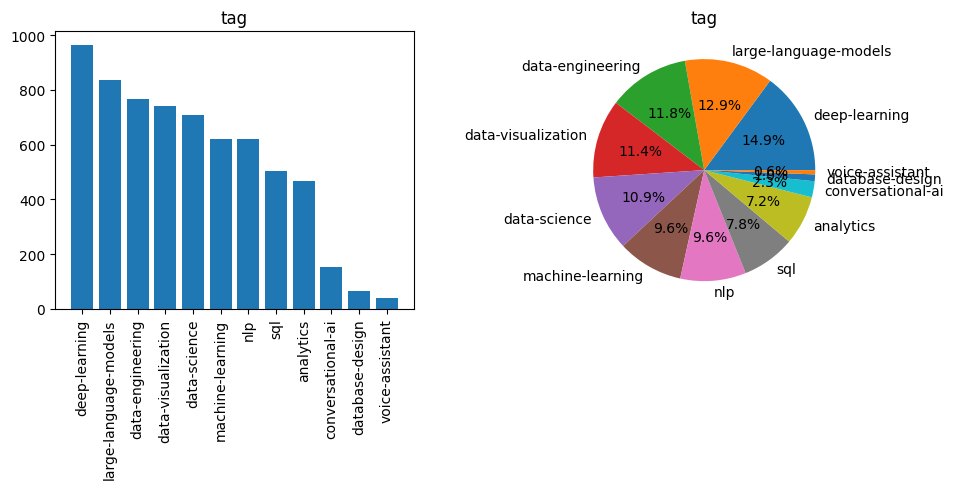

'Now, value_counts() for tag:'

tag
deep-learning            966
large-language-models    837
data-engineering         768
data-visualization       741
data-science             708
machine-learning         620
nlp                      620
sql                      505
analytics                466
conversational-ai        152
database-design           64
voice-assistant           40
Name: count, dtype: int64

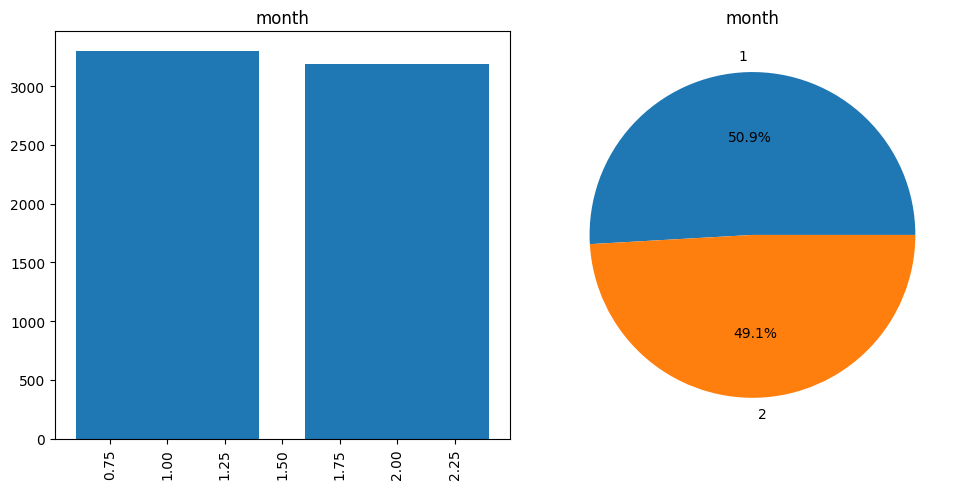

'Now, value_counts() for month:'

month
1    3302
2    3185
Name: count, dtype: int64

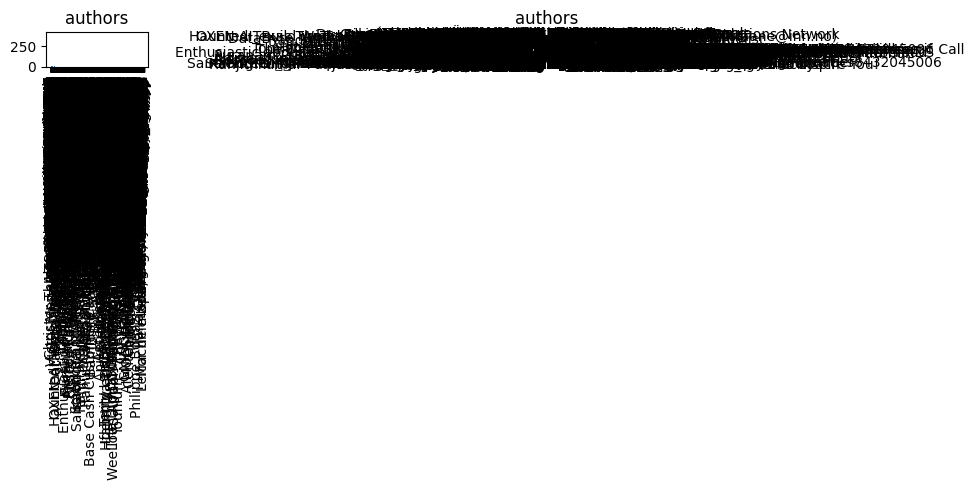

'Now, value_counts() for authors:'

authors
Monodeep Mukherjee          396
Cobus Greyling               76
Ritvik Rastogi               38
ODSC - Open Data Science     31
Okan Yenigün                 28
                           ... 
Lucas Pereyra                 0
Lucasvittal                   0
Luciano Badilla               0
Luciano Lera Bossi            0
Lux Li                        0
Name: count, Length: 5565, dtype: int64

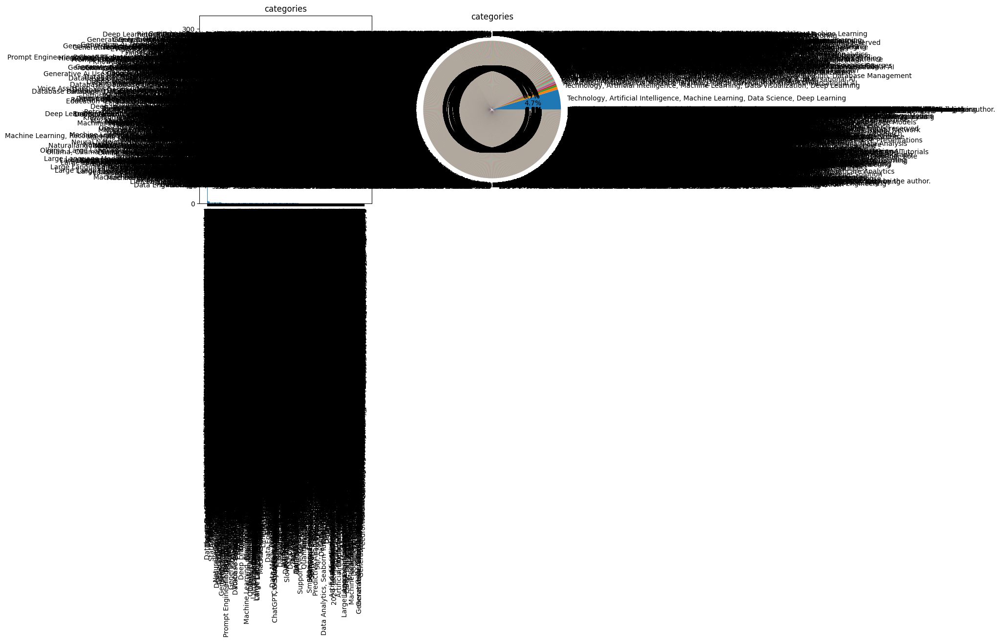

'Now, value_counts() for categories:'

categories
Technology, Artificial Intelligence, Machine Learning, Data Science, Deep Learning          307
Technology, Artificial Intelligence, Machine Learning, Data Visualization, Deep Learning     44
AI, Artificial Intelligence, Machine Learning, Large Language Models, Conversational AI      27
Marketing, Analytics, Marketing Analytics, Data Analytics, Digital Marketing                 23
Data Science, Artificial Intelligence, Machine Learning, Deep Learning, NLP                  16
                                                                                           ... 
Fitness, Women, Deep Learning, Books, Culture                                                 0
Fitness, Mindfulness, Deep Learning, Lifestyle, Education                                     0
Fitness, Deep Learning, Women, AWS, Culture                                                   0
Fitness, Deep Learning, Culture, Productivity, Python                                         0
Generative Model, Discriminat

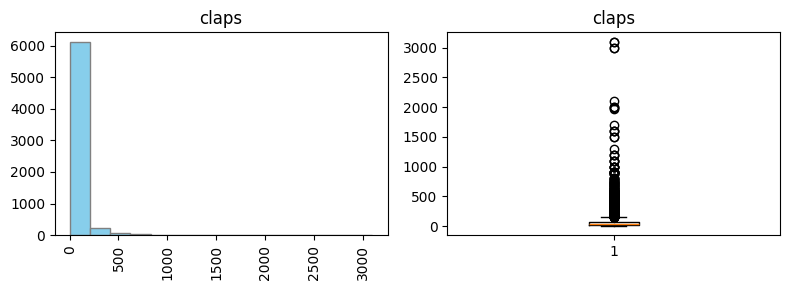

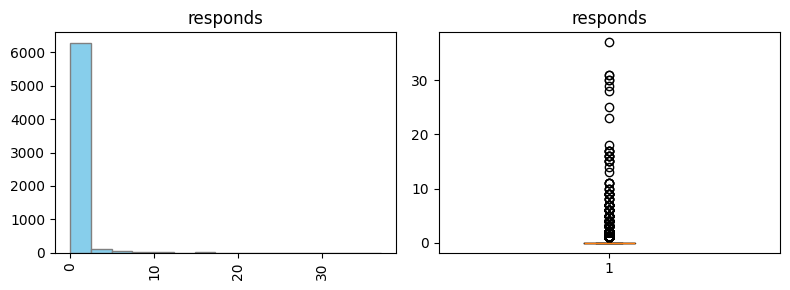

In [52]:
for i, column in enumerate(list(df_merged.columns)):

    if column in quant_cols:
        univ_num(df_merged[column], column)

    if column in cat_cols:
        univ_cat(df_merged[column], column)
        display("Now, value_counts() for " + column + ":")
        display(df_merged[column].value_counts())

In [53]:
## Bi variate analysis

In [54]:
### Quantitative columns

In [55]:
quant_cols = ["claps", "responds"]

In [56]:
from scipy.stats import pearsonr

tt_dict = {}
temp = []
alpha = 0.05

for i in quant_cols:
    temp.append(i)
    for j in quant_cols:
        if not (j in temp):
            r, p = pearsonr(df_merged[i], df_merged[j])

            if p > alpha:
                conclusion = "2 means likely equals"
            else:
                conclusion = "2 means NOT likely equals"

            tt_dict[str(i) + " / " + str(j)] = {
                "conclusion": conclusion,
                "p-value": p,
                "Pearson s r": r,
            }
tt_df = pd.DataFrame.from_dict(tt_dict)
display(tt_df)

,claps / responds
conclusion,2 means NOT likely equals
p-value,0.0
Pearson s r,0.665705


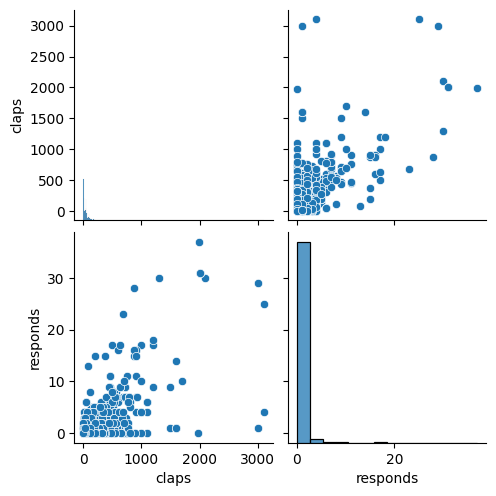

In [57]:
import seaborn as sns

sns.pairplot(df_merged[quant_cols])
plt.show()

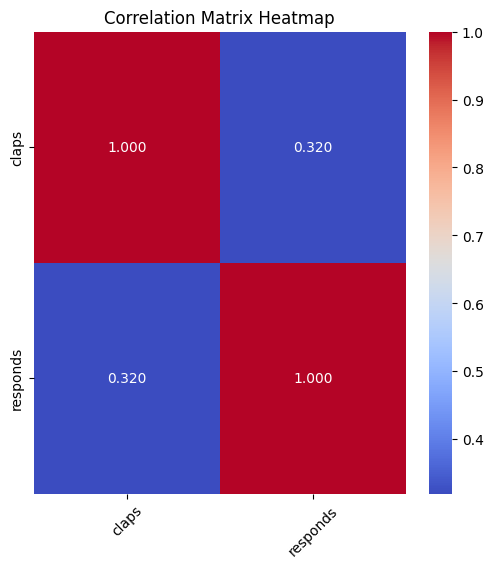

In [58]:
df_merged[quant_cols].corr(method="spearman")

# heatmap

correlation_matrix = df_merged[quant_cols].corr(
    method="spearman"
)  # because Pearson is for linearity

# mask = np.triu(correlation_matrix)

plt.figure(figsize=(6, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".3f")  # , mask=mask)

plt.title("Correlation Matrix Heatmap")
plt.xticks(rotation=45)
plt.show()

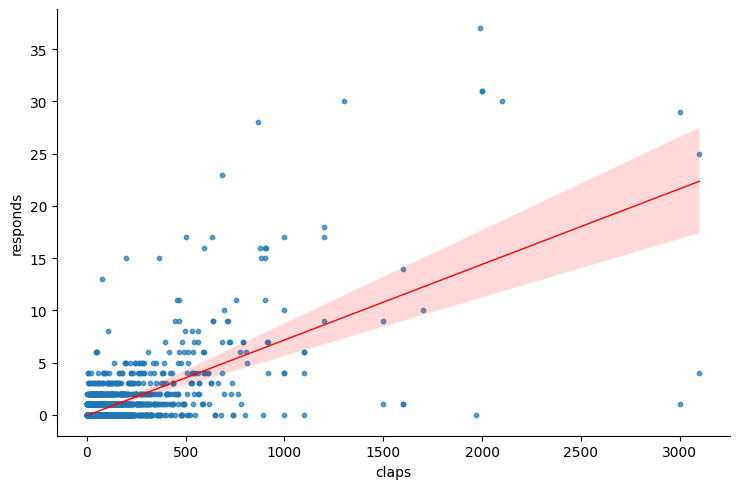

In [59]:
# Create the scatter plot with regression line
sns.lmplot(
    x="claps",
    y="responds",
    data=df_merged,
    aspect=1.5,
    line_kws={"color": "red", "linewidth": 1},
    scatter_kws={"s": 10, "alpha": 0.7},
)
# line_kws sont les options d'affichage pour la ligne et scatter_kws pour le scatter avec s la size et alpha la transparence
plt.xlabel("claps")
plt.ylabel("responds")

plt.show()

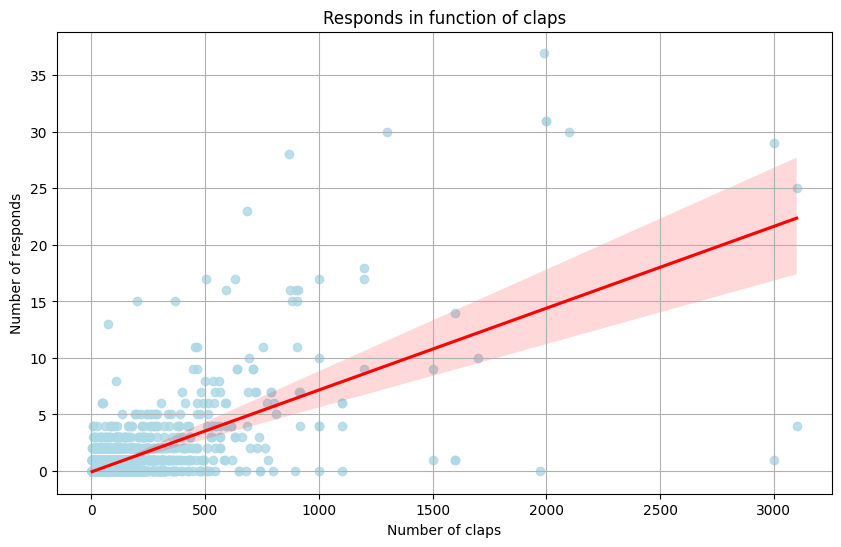

In [60]:
plt.figure(figsize=(10, 6))
sns.regplot(
    x="claps",
    y="responds",
    data=df_merged,
    # ci=None,
    scatter_kws={"color": "lightblue"},
    line_kws={"color": "red"},
)

plt.title("Responds in function of claps")
plt.xlabel("Number of claps")
plt.ylabel("Number of responds")
plt.grid(True)
plt.show()

In [61]:
### Quantitative vs. categorical columns

In [133]:
cat_cols = ["tag"]

quant_cols = ["claps", "responds"]

from statsmodels.formula.api import ols
import statsmodels.api as sm

anova_test_dict = {}
temp = []
alpha = 0.05

for i in cat_cols:
    for j in quant_cols:
        if i != j:
            model = ols(j + "~" + i, data=df_merged).fit()
            print(j)
            anova_table = sm.stats.anova_lm(model, typ=2)
            display(anova_table)
            F = anova_table.iloc[0, 2]
            f = anova_table.iloc[0, 3]
            if f > alpha:
                conclusion = "H0 can't be rejected at the risk of 5%: means of groups are likely the same"
            else:
                conclusion = (
                    "H0 is rejected at the risk of 5%: means of groups are not the same"
                )

            anova_test_dict[str(i) + " / " + str(j)] = {
                "F": F,
                "PR(>F)": f,
                "conclusion": conclusion,
            }
anova_test_df = pd.DataFrame.from_dict(anova_test_dict)
anova_test_df

claps


,sum_sq,df,F,PR(>F)
tag,1.325328e+06,11.0,5.502389,8.200800e-09
Residual,1.417814e+08,6475.0,NaN,NaN


responds


,sum_sq,df,F,PR(>F)
tag,107.009130,11.0,3.746053,0.000023
Residual,16814.890669,6475.0,NaN,NaN


,tag / claps,tag / responds
F,5.502389,3.746053
PR(>F),0.0,0.000023
conclusion,H0 is rejected at the risk of 5%: means of gro...,H0 is rejected at the risk of 5%: means of gro...


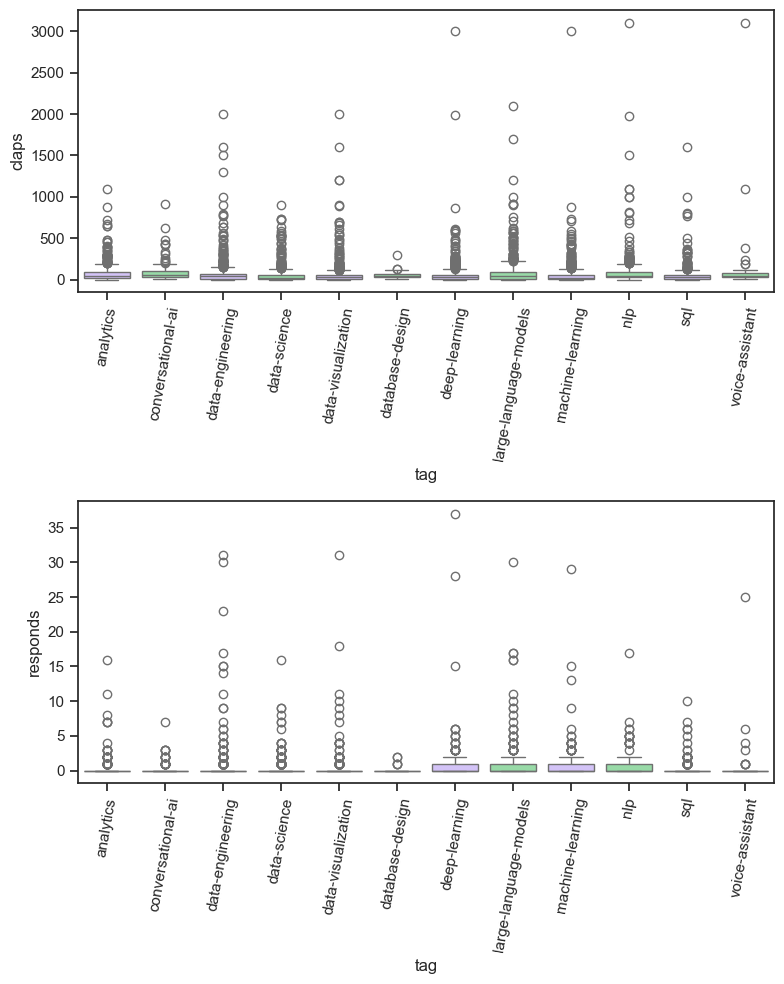

In [62]:
cat_cols = ["tag"]

quant_cols = ["claps", "responds"]

sns.set_theme(style="ticks", palette="pastel")

# Draw a nested boxplot

fig, ax = plt.subplots(nrows=len(cat_cols) * len(quant_cols), ncols=1, figsize=[8, 10])
row = 0
for i in quant_cols:
    # print("----------------------------------------------------------------------------------------------")
    for j in cat_cols:
        sns.boxplot(x=j, y=i, palette=["m", "g"], data=df_merged, ax=ax[row])
        # sns.despine(offset=10, trim=True)
        ax[row].tick_params(axis="x", rotation=80)
        row += 1


plt.tight_layout()
plt.show()

In [63]:
df_merged[df_merged["claps"] > 600]["authors"].unique

<bound method Series.unique of 5          Cobus Greyling
130        Cobus Greyling
338           Denise Holt
401       Jeevan Sreerama
1716           Kyle Wells
               ...       
11014        Dorian Teffo
11212       Ritikajaiswal
11721        Hamza Gharbi
11736       Team H.A.C.K.
11747    SQLens By OSLabs
Name: authors, Length: 73, dtype: category
Categories (5565, object): ['SCLAB Studio', '- solace -', '0xAISwap', '0𝕏koji', ..., '박규리 | kyuriepark', '조태완(Taewan)', '💖Edita Mustedanagic💖', '💡Mike Shakhomirov']>

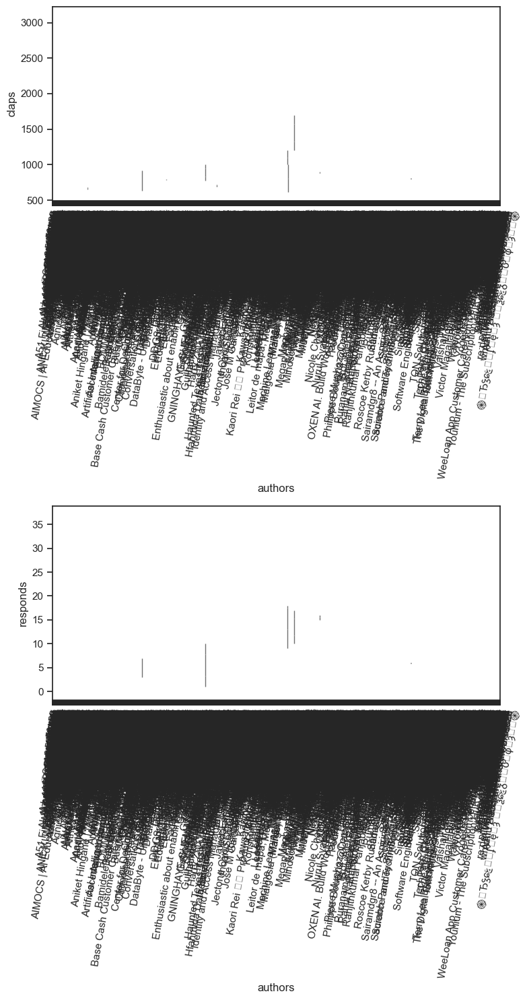

In [ ]:
# there are too many unique authors so let's narrow to claps>600

cat_cols = ["authors"]

quant_cols = ["claps", "responds"]

sns.set_theme(style="ticks", palette="pastel")

# Draw a nested boxplot

fig, ax = plt.subplots(nrows=len(cat_cols) * len(quant_cols), ncols=1, figsize=[8, 15])
row = 0
for i in quant_cols:
    # print("----------------------------------------------------------------------------------------------")
    for j in cat_cols:
        sns.boxplot(
            x=j,
            y=i,
            palette=["m", "g"],
            data=df_merged[df_merged["claps"] > 900],
            ax=ax[row],
        )
        # sns.despine(offset=10, trim=True)
        ax[row].tick_params(axis="x", rotation=80)
        row += 1


plt.tight_layout()
plt.show()

In [65]:
### Categorical columns

# This is not relevant for now
# Relevant insight can be the categories by tags. For this we need to explode the "categories" column

In [66]:
# Now, EDA with the category columns exploded to have insight for each categories

In [67]:
df_merged_exploded = df_merged.copy()
df_merged_exploded.columns

Index(['tag', 'month', 'title', 'authors', 'link', 'categories', 'claps',
       'responds', 'catch_phrase', 'text'],
      dtype='object')

In [68]:
df_merged_exploded = df_merged.copy()
# df_merged_exploded = df_merged_exploded.drop(columns=["title", "link", "text"])
df_merged_exploded["categories"] = df_merged_exploded["categories"].str.split(pat=",")
df_merged_exploded = df_merged_exploded.explode("categories")
df_merged_exploded["categories"] = df_merged_exploded["categories"].str.strip()
df_merged_exploded["categories"] = df_merged_exploded["categories"].str.lower()
df_merged_exploded

,tag,month,title,authors,link,categories,claps,responds,catch_phrase,text
0,conversational-ai,1,New Features Agent Ai Chat Bot By I Need Leads...,Ineedleadsuk,https://medium.com/@ineedleadsuk/new-features-...,ai chat bot,30.0,0.0,0,"In this article, I will show you some of the ..."
0,conversational-ai,1,New Features Agent Ai Chat Bot By I Need Leads...,Ineedleadsuk,https://medium.com/@ineedleadsuk/new-features-...,ai chatbot,30.0,0.0,0,"In this article, I will show you some of the ..."
0,conversational-ai,1,New Features Agent Ai Chat Bot By I Need Leads...,Ineedleadsuk,https://medium.com/@ineedleadsuk/new-features-...,conversational ai,30.0,0.0,0,"In this article, I will show you some of the ..."
0,conversational-ai,1,New Features Agent Ai Chat Bot By I Need Leads...,Ineedleadsuk,https://medium.com/@ineedleadsuk/new-features-...,business crm software,30.0,0.0,0,"In this article, I will show you some of the ..."
0,conversational-ai,1,New Features Agent Ai Chat Bot By I Need Leads...,Ineedleadsuk,https://medium.com/@ineedleadsuk/new-features-...,crm,30.0,0.0,0,"In this article, I will show you some of the ..."
...,...,...,...,...,...,...,...,...,...,...
11891,sql,2,Data Engineer: PostgreSQL Best Practice,Prem Vishnoi(cloudvala),https://medium.com/@premvishnoi/data-engineer-...,postgresql,24.0,1.0,0,"When working with PostgreSQL, adhering to cer..."
11891,sql,2,Data Engineer: PostgreSQL Best Practice,Prem Vishnoi(cloudvala),https://medium.com/@premvishnoi/data-engineer-...,sql,24.0,1.0,0,"When working with PostgreSQL, adhering to cer..."
11891,sql,2,Data Engineer: PostgreSQL Best Practice,Prem Vishnoi(cloudvala),https://medium.com/@premvishnoi/data-engineer-...,data engineer,24.0,1.0,0,"When working with PostgreSQL, adhering to cer..."
11891,sql,2,Data Engineer: PostgreSQL Best Practice,Prem Vishnoi(cloudvala),https://medium.com/@premvishnoi/data-engineer-...,data,24.0,1.0,0,"When working with PostgreSQL, adhering to cer..."


In [69]:
## Univariate analysis

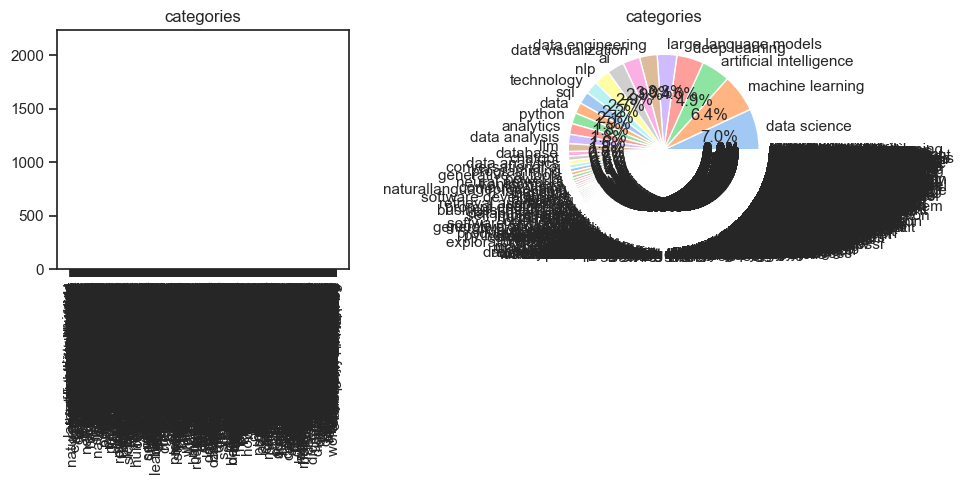

'Now, value_counts() for categories:'

categories
data science               2126
machine learning           1957
artificial intelligence    1482
deep learning              1392
large language models      1017
                           ... 
green economy                 1
just transition               1
evaluation techniques         1
company databases             1
spring                        1
Name: count, Length: 3739, dtype: int64

In [70]:
univ_cat(df_merged_exploded["categories"], "categories")
display("Now, value_counts() for " + "categories" + ":")
display(df_merged_exploded["categories"].value_counts())

In [71]:
# Calcul des statistiques requises
pivot_table = pd.pivot_table(
    df_merged_exploded,
    index="categories",
    aggfunc={
        "title": "count",  # Nombre de lignes
        "claps": "sum",  # Total des claps
        "responds": "sum",  # Total des réponses
    },
)

pivot_table["Average Claps per Row"] = pivot_table["claps"] / pivot_table["title"]
pivot_table["Average Responds per Row"] = pivot_table["responds"] / pivot_table["title"]

# Réordonner les colonnes pour répondre à votre spécification
pivot_table = pivot_table[
    ["title", "claps", "Average Claps per Row", "responds", "Average Responds per Row"]
]

# Renommer les colonnes
pivot_table.columns = [
    "Number of Rows",
    "Total Number of Claps",
    "Average Number of Claps per Row",
    "Total Number of Responds",
    "Average Number of Responds per Row",
]

# Afficher le tableau croisé
display(pivot_table)

,Number of Rows,Total Number of Claps,Average Number of Claps per Row,Total Number of Responds,Average Number of Responds per Row
categories,,,,,
100daychallenge,1,8.0,8.0,0.0,0.0
100daysofcode,2,57.0,28.5,0.0,0.0
12 days of salesforce,1,51.0,51.0,0.0,0.0
12 factor,1,63.0,63.0,0.0,0.0
12 factor app,1,63.0,63.0,0.0,0.0
...,...,...,...,...,...
éducation,1,4.0,4.0,0.0,0.0
émotion,1,63.0,63.0,1.0,1.0
علم البيانات,1,39.0,39.0,1.0,1.0


In [147]:
display(
    pivot_table[pivot_table["Number of Rows"] > 200].sort_values(
        by="Total Number of Claps", ascending=False
    )
)

,Number of Rows,Total Number of Claps,Average Number of Claps per Row,Total Number of Responds,Average Number of Responds per Row
categories,,,,,
data science,816139,85466563.0,104.720597,643652.0,0.788655
machine learning,818759,77760105.0,94.973130,527265.0,0.643981
large language models,537979,56778877.0,105.541066,459826.0,0.854729
artificial intelligence,566001,56260996.0,99.400877,377916.0,0.667695
ai,432523,50556298.0,116.886959,405103.0,0.936605
...,...,...,...,...,...
digital assets management,230,690.0,3.000000,0.0,0.000000
cryptocurrency security,230,690.0,3.000000,0.0,0.000000
ai in finance,230,690.0,3.000000,0.0,0.000000


In [171]:
display(
    pivot_table[pivot_table["Total Number of Claps"] > 10000000].sort_values(
        by="Total Number of Claps", ascending=False
    )
)

,Number of Rows,Total Number of Claps,Average Number of Claps per Row,Total Number of Responds,Average Number of Responds per Row
categories,,,,,
data science,816139,85466563.0,104.720597,643652.0,0.788655
machine learning,818759,77760105.0,94.973130,527265.0,0.643981
large language models,537979,56778877.0,105.541066,459826.0,0.854729
artificial intelligence,566001,56260996.0,99.400877,377916.0,0.667695
ai,432523,50556298.0,116.886959,405103.0,0.936605
data engineering,410633,45246366.0,110.186872,404721.0,0.985603
deep learning,535700,44036546.0,82.203745,358844.0,0.669860
nlp,398163,42797386.0,107.487100,307807.0,0.773068
data visualization,351588,32196465.0,91.574414,247381.0,0.703610


In [172]:
index_list_top_claps_categories = (
    pivot_table[pivot_table["Total Number of Claps"] > 10000000]
    .sort_values(by="Total Number of Claps", ascending=False)
    .index.tolist()
)
index_list_top_claps_categories

['data science',
 'machine learning',
 'large language models',
 'artificial intelligence',
 'ai',
 'data engineering',
 'deep learning',
 'nlp',
 'data visualization',
 'python',
 'analytics',
 'data',
 'llm',
 'programming',
 'sql',
 'technology',
 'data analysis',
 'chatgpt',
 'data analytics',
 'database']

In [134]:
significant_categories_exploded = df_merged_exploded.copy()
significant_categories_exploded = significant_categories_exploded[
    significant_categories_exploded["claps"] > 200
]
significant_categories_exploded

,tag,month,title,authors,link,categories,claps,responds,catch_phrase,text
4,conversational-ai,1,MultiHop-RAG,Cobus Greyling,https://medium.com/@cobusgreyling/multihop-rag...,ai,435.0,3.0,A recent direction in RAG architecture is esta...,Considering the development of the Large Lang...
4,conversational-ai,1,MultiHop-RAG,Cobus Greyling,https://medium.com/@cobusgreyling/multihop-rag...,artificial intelligence,435.0,3.0,A recent direction in RAG architecture is esta...,Considering the development of the Large Lang...
4,conversational-ai,1,MultiHop-RAG,Cobus Greyling,https://medium.com/@cobusgreyling/multihop-rag...,machine learning,435.0,3.0,A recent direction in RAG architecture is esta...,Considering the development of the Large Lang...
4,conversational-ai,1,MultiHop-RAG,Cobus Greyling,https://medium.com/@cobusgreyling/multihop-rag...,large language models,435.0,3.0,A recent direction in RAG architecture is esta...,Considering the development of the Large Lang...
4,conversational-ai,1,MultiHop-RAG,Cobus Greyling,https://medium.com/@cobusgreyling/multihop-rag...,conversational ai,435.0,3.0,A recent direction in RAG architecture is esta...,Considering the development of the Large Lang...
...,...,...,...,...,...,...,...,...,...,...
11800,sql,2,Optimizing SQL Databases for Read Heavy Operat...,Minura Samaranayake,https://medium.com/bitsrc/optimizing-sql-datab...,backend,322.0,0.0,Key Strategies for Efficient Read-Heavy Worklo...,Effective Utilization of Resources: SQL queri...
11815,sql,2,An introduction to views: creating MySQL views,Bukola Olafenwa,https://medium.com/@bukolaolafenwa/an-introduc...,sql,201.0,0.0,0,"Simulations are often partial, combining spec..."
11815,sql,2,An introduction to views: creating MySQL views,Bukola Olafenwa,https://medium.com/@bukolaolafenwa/an-introduc...,mysql,201.0,0.0,0,"Simulations are often partial, combining spec..."
11815,sql,2,An introduction to views: creating MySQL views,Bukola Olafenwa,https://medium.com/@bukolaolafenwa/an-introduc...,views,201.0,0.0,0,"Simulations are often partial, combining spec..."


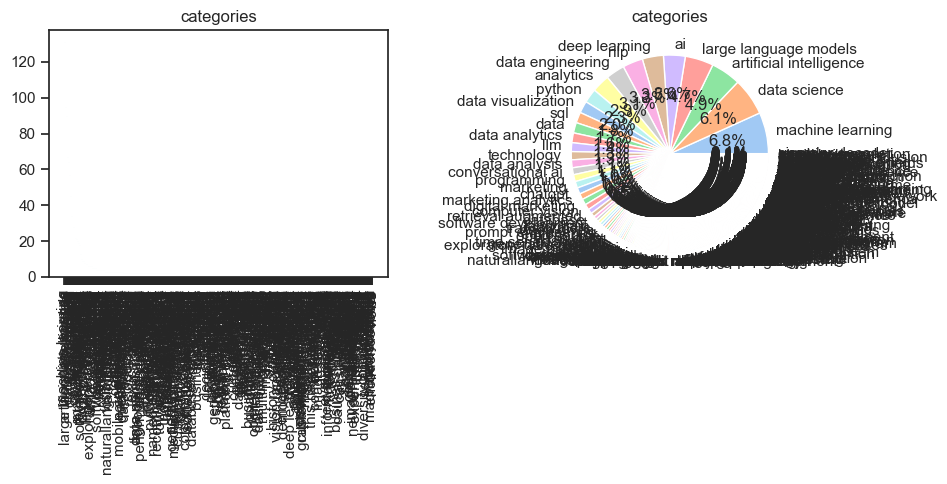

'Now, value_counts() for categories:'

categories
machine learning           131
data science               119
artificial intelligence     95
large language models       90
ai                          69
                          ... 
paper summary                1
rnn                          1
machine translation          1
encoder decoder              1
views                        1
Name: count, Length: 474, dtype: int64

In [135]:
univ_cat(significant_categories_exploded["categories"], "categories")
display("Now, value_counts() for " + "categories" + ":")
display(significant_categories_exploded["categories"].value_counts())

In [136]:
## Bi variate analysis

In [137]:
### Quantitative vs. categorical columns

cat_cols = ["categories"]

quant_cols = ["claps", "responds"]

In [138]:
from statsmodels.formula.api import ols
import statsmodels.api as sm

anova_test_dict = {}
temp = []
alpha = 0.05

for i in cat_cols:
    for j in quant_cols:
        if i != j:
            model = ols(j + "~" + i, data=significant_categories_exploded).fit()
            print(j)
            anova_table = sm.stats.anova_lm(model, typ=2)
            display(anova_table)
            F = anova_table.iloc[0, 2]
            f = anova_table.iloc[0, 3]
            if f > alpha:
                conclusion = "H0 can't be rejected at the risk of 5%: means of groups are likely the same"
            else:
                conclusion = (
                    "H0 is rejected at the risk of 5%: means of groups are not the same"
                )

            anova_test_dict[str(i) + " / " + str(j)] = {
                "F": F,
                "PR(>F)": f,
                "conclusion": conclusion,
            }
anova_test_df = pd.DataFrame.from_dict(anova_test_dict)
anova_test_df

claps


,sum_sq,df,F,PR(>F)
categories,1.156017e+08,473.0,1.681542,2.164689e-13
Residual,2.123466e+08,1461.0,NaN,NaN


responds


,sum_sq,df,F,PR(>F)
categories,20524.211558,473.0,1.820068,2.392143e-17
Residual,34831.166220,1461.0,NaN,NaN


,categories / claps,categories / responds
F,1.681542,1.820068
PR(>F),0.0,0.0
conclusion,H0 is rejected at the risk of 5%: means of gro...,H0 is rejected at the risk of 5%: means of gro...


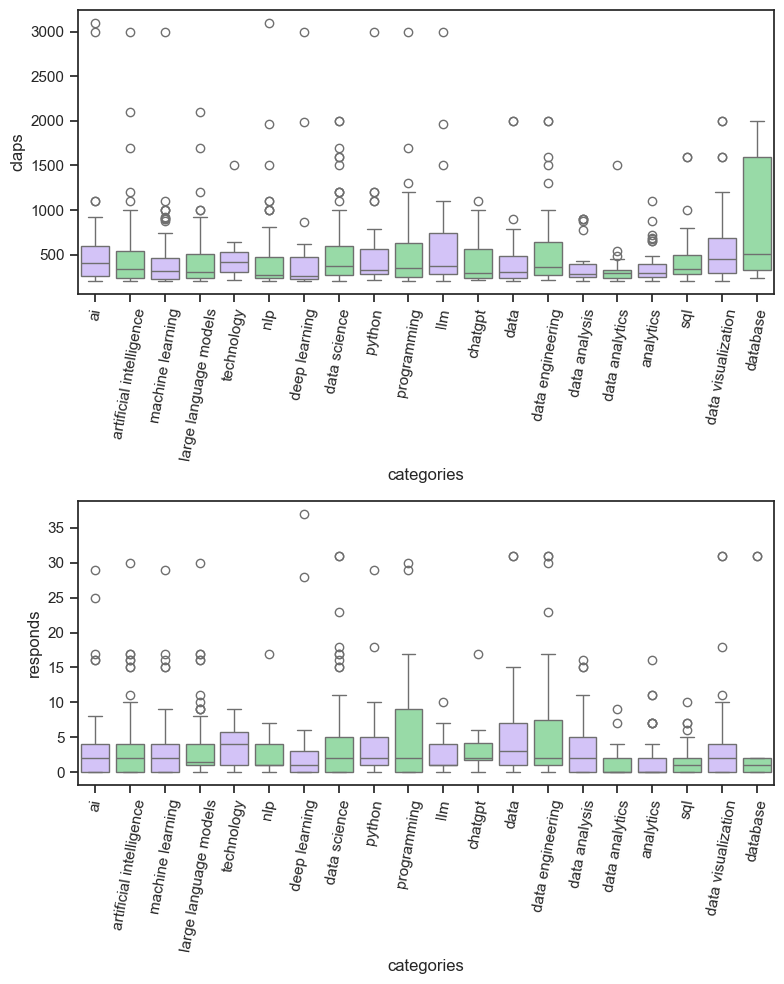

In [174]:
### Quantitative vs. categorical columns

cat_cols = ["categories"]

quant_cols = ["claps", "responds"]

sns.set_theme(style="ticks", palette="pastel")

# Draw a nested boxplot

fig, ax = plt.subplots(nrows=len(cat_cols) * len(quant_cols), ncols=1, figsize=[8, 10])
row = 0
for i in quant_cols:
    # print("----------------------------------------------------------------------------------------------")
    for j in cat_cols:
        sns.boxplot(
            x=j,
            y=i,
            palette=["m", "g"],
            data=significant_categories_exploded[
                significant_categories_exploded["categories"].isin(
                    index_list_top_claps_categories
                )
            ],
            ax=ax[row],
        )
        # sns.despine(offset=10, trim=True)
        ax[row].tick_params(axis="x", rotation=80)
        row += 1


plt.tight_layout()
plt.show()

In [140]:
### Categoricals columns

In [141]:
df_merged_exploded.columns

Index(['tag', 'month', 'title', 'authors', 'link', 'categories', 'claps',
       'responds', 'catch_phrase', 'text'],
      dtype='object')

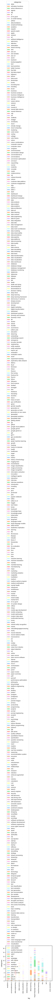

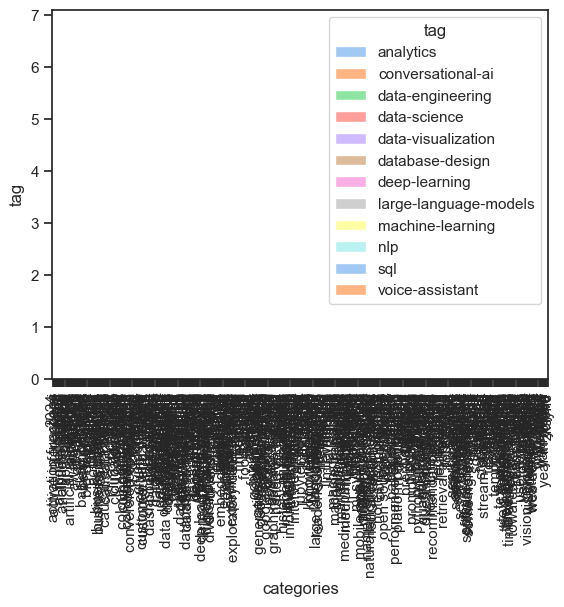

In [143]:
cat_cols = ["tag", "categories"]

quant_cols = ["claps", "responds"]

for i in cat_cols:
    for j in cat_cols:
        if i != j:
            cont_table = (
                pd.crosstab(
                    index=significant_categories_exploded[i],
                    columns=significant_categories_exploded[j],
                    normalize=True,
                    # margins=True,
                )
                * 100
            )
            cont_table.plot(kind="bar", stacked=True)
            plt.xlabel(i)
            plt.ylabel(j)
            plt.show()

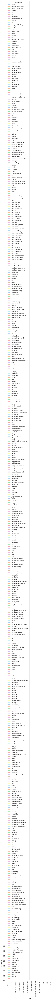

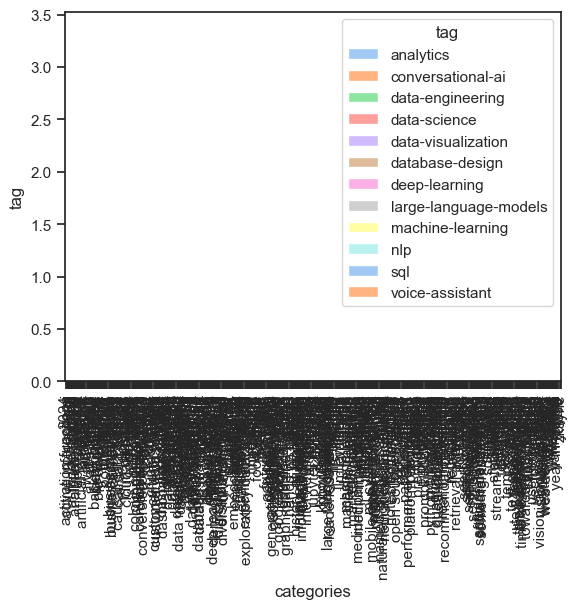

In [144]:
for i in cat_cols:
    for j in cat_cols:
        if i != j:
            cont_table = (
                pd.crosstab(
                    index=significant_categories_exploded[i],
                    columns=significant_categories_exploded[j],
                    normalize=True,
                    # margins=True,
                )
                * 100
            )
            cont_table.plot(kind="bar", stacked=False)
            plt.xlabel(i)
            plt.ylabel(j)
            plt.show()

## LDA and top topic research

### Using title + leadsentence + body

In [86]:
#!pip install gensim spacy
#!python -m spacy download en_core_web_sm
#!python -m spacy download es_core_news_sm
#!python -m spacy download pt_core_news_sm
#!python -m spacy download fr_core_news_sm

In [87]:
import spacy
from gensim import corpora, models

In [88]:
nltk.download("stopwords")
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.util import ngrams

import re


# New method to clean, wanted a different one to the raw tokens because that is very 1 word specific
def clean_and_2gram(text, n=2):
    if not isinstance(text, str):
        return []

    stopwords_english = stopwords.words("english")

    text = text.lower()
    words = text.split()
    words = [w for w in words if w not in stopwords_english]
    sentence = " ".join([w for w in words])
    sentence = re.sub(r"[^a-zA-Z]", " ", text)
    words = sentence.split()
    words = [w.strip() for w in words if w not in stopwords_english and len(w) > 2]
    clean_text = " ".join([w for w in words])

    tokens = nltk.word_tokenize(clean_text)
    stop_words = set(stopwords.words("english"))

    n_grams = ngrams(tokens, n)

    return [" ".join(grams) for grams in n_grams]

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\romai\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [89]:
# Assuming column
df_merged["Combined_Text"] = (
    df_merged["title"].fillna("")
    + " "
    + df_merged["catch_phrase"].fillna("")
    + " "
    + df_merged["text"].fillna("")
)
df_merged["Combined_Text"] = df_merged["Combined_Text"].apply(
    lambda x: str(x).lower().strip()
)

# Going for 2grams
# Most of the interesting things in the data is 2 words, names (eg Sam Altman), etc. Plus, ran on 3 grams and a lot less clear.
df_merged["2grams"] = df_merged["Combined_Text"].apply(
    lambda x: clean_and_2gram(x, n=2)
)
processed_texts = df_merged["2grams"].tolist()
# processed_texts = [preprocess_texts(text) for text in texts]

processed_texts

[['new features',
  'features agent',
  'agent chat',
  'chat bot',
  'bot need',
  'need leads',
  'leads ltd',
  'ltd article',
  'article show',
  'show new',
  'new features',
  'features www',
  'www theineedagent',
  'theineedagent added',
  'added help',
  'help boost',
  'boost business',
  'business even',
  'even features',
  'features designed',
  'designed enhance',
  'enhance customer',
  'customer experience',
  'experience streamline',
  'streamline operations',
  'operations increase',
  'increase conversions',
  'conversions one',
  'one new',
  'new features',
  'features www',
  'www theineedagent',
  'theineedagent added',
  'added ability',
  'ability prevent',
  'prevent bot',
  'bot changes',
  'changes refreshing',
  'refreshing pages',
  'pages means',
  'means bot',
  'bot maintain',
  'maintain consistency',
  'consistency avoid',
  'avoid confusion',
  'confusion customers',
  'customers example',
  'example customer',
  'customer chatting',
  'chatting bot'

In [90]:
# Creating a dictionary and corpus for LDA
processed_texts = df_merged["2grams"].tolist()
dictionary = corpora.Dictionary(processed_texts)
corpus = [dictionary.doc2bow(text) for text in processed_texts]

# Training the LDA model
lda_model = models.LdaModel(corpus, num_topics=5, id2word=dictionary, passes=15)

# Displaying the topics
topics = lda_model.print_topics(num_words=5)
for topic in topics:
    print(topic)

(0, '0.000*"https sqlspecialist" + 0.000*"part https" + 0.000*"sqlspecialist part" + 0.000*"machine learning" + 0.000*"mental health"')
(1, '0.001*"data analysis" + 0.001*"machine learning" + 0.001*"data science" + 0.001*"data engineering" + 0.001*"sql queries"')
(2, '0.002*"language models" + 0.001*"large language" + 0.001*"natural language" + 0.001*"language processing" + 0.001*"artificial intelligence"')
(3, '0.000*"machine learning" + 0.000*"language models" + 0.000*"self attention" + 0.000*"neural network" + 0.000*"deep learning"')
(4, '0.001*"machine learning" + 0.001*"neural networks" + 0.001*"deep learning" + 0.001*"fine tuning" + 0.001*"neural network"')


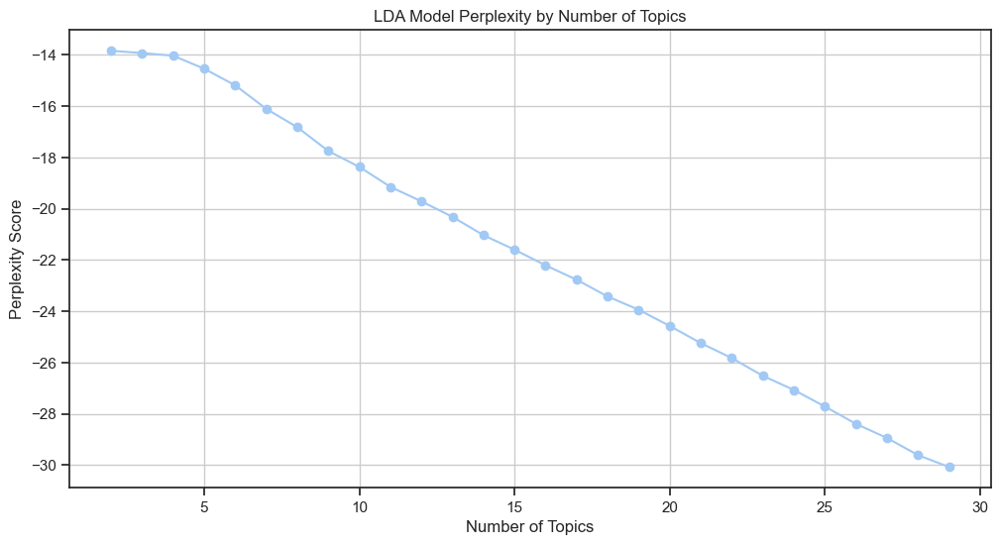

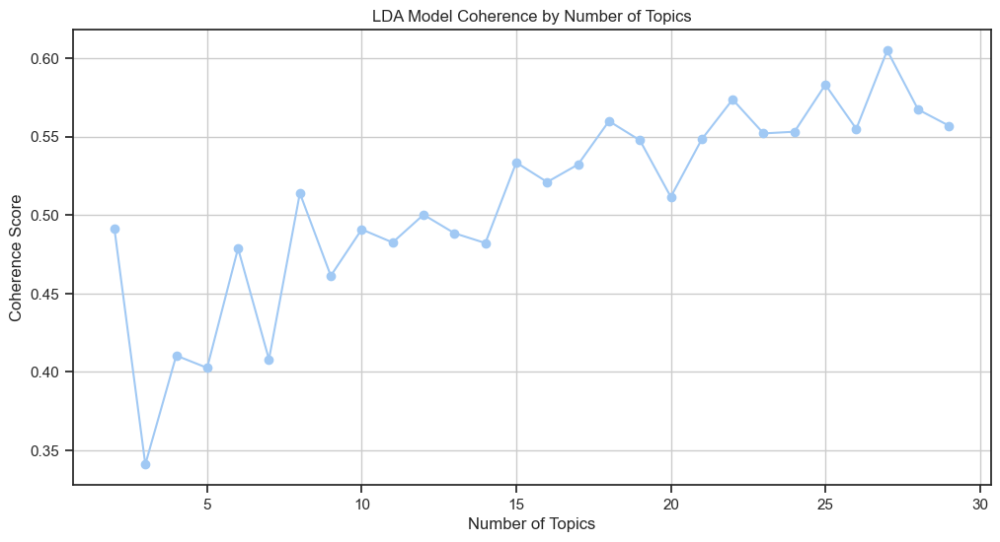

In [91]:
from gensim import corpora, models
from gensim.models.coherencemodel import CoherenceModel


def train_lda_models(dictionary, corpus, texts, start, limit, step):
    """
    Train multiple LDA models, calculate perplexity and coherence for each.

    Parameters:
    - dictionary : Gensim dictionary
    - corpus : Gensim corpus
    - texts : List of input texts
    - start : Start number of topics
    - limit : Max number of topics
    - step : Step size for the number of topics

    Returns:
    - model_list : List of LDA topic models
    - coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    - perplexity_values : Perplexity values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    perplexity_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        # Train LDA model
        model = models.LdaModel(
            corpus,
            num_topics=num_topics,
            id2word=dictionary,
            passes=15,
            random_state=100,
        )
        model_list.append(model)

        # Calculate perplexity and coherence
        perplexity_values.append(model.log_perplexity(corpus))
        coherencemodel = CoherenceModel(
            model=model, texts=texts, dictionary=dictionary, coherence="c_v"
        )
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values, perplexity_values


# Function to plot the metric values
def plot_metric(x_values, y_values, title, x_label, y_label):
    """
    Function to plot metric values.

    Parameters:
    - x_values : X-axis values (Number of topics)
    - y_values : Y-axis values (Metric values)
    - title : Title of the plot
    - x_label : Label of the x-axis
    - y_label : Label of the y-axis
    """
    plt.figure(figsize=(12, 6))
    plt.plot(x_values, y_values, marker="o")
    plt.title(title)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.grid(True)
    plt.show()


start = 2
limit = 30
step = 1

model_list, coherence_values, perplexity_values = train_lda_models(
    dictionary, corpus, processed_texts, start, limit, step
)

plot_metric(
    list(range(start, limit, step)),
    perplexity_values,
    "LDA Model Perplexity by Number of Topics",
    "Number of Topics",
    "Perplexity Score",
)

plot_metric(
    list(range(start, limit, step)),
    coherence_values,
    "LDA Model Coherence by Number of Topics",
    "Number of Topics",
    "Coherence Score",
)

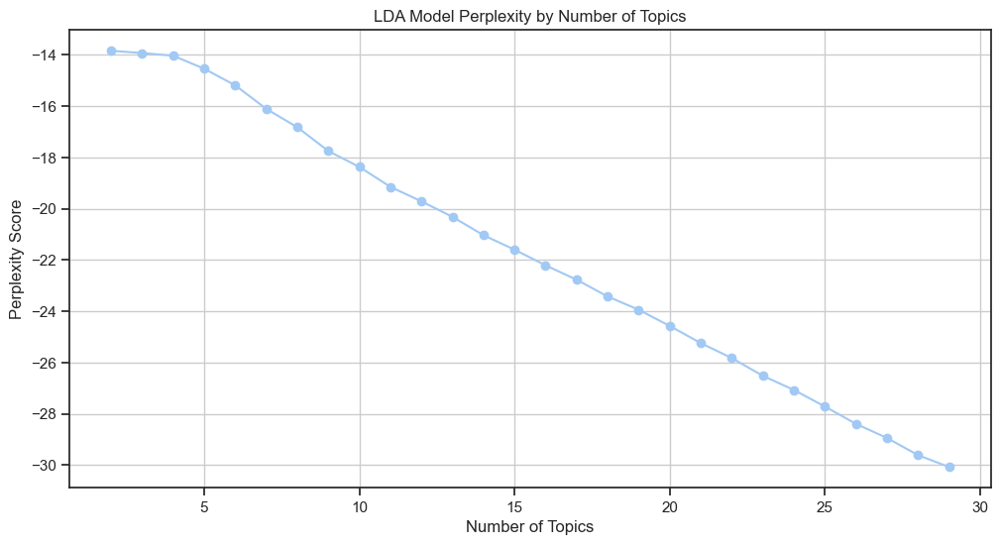

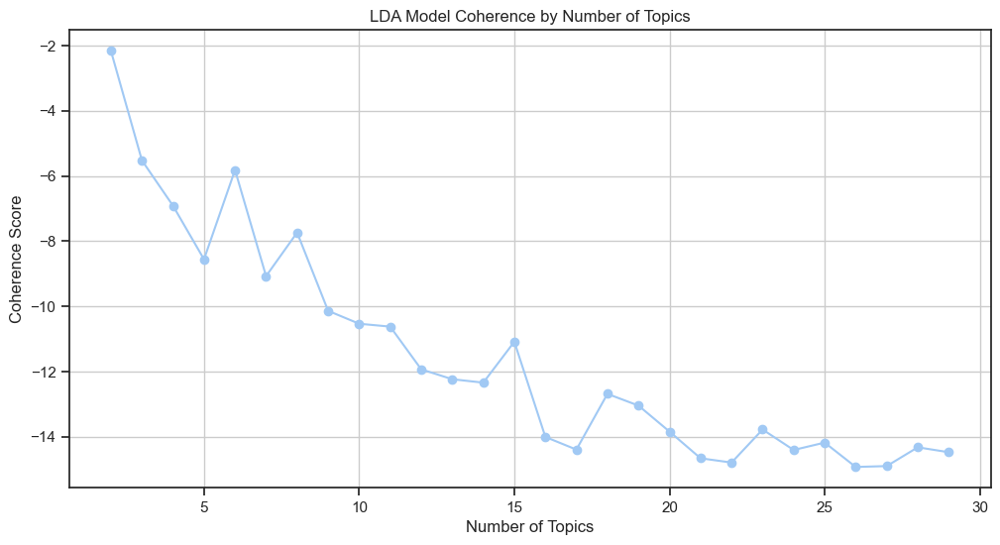

In [92]:
from gensim import corpora, models
from gensim.models.coherencemodel import CoherenceModel


def train_lda_models(dictionary, corpus, texts, start, limit, step):
    """
    Train multiple LDA models, calculate perplexity and coherence for each.

    Parameters:
    - dictionary : Gensim dictionary
    - corpus : Gensim corpus
    - texts : List of input texts
    - start : Start number of topics
    - limit : Max number of topics
    - step : Step size for the number of topics

    Returns:
    - model_list : List of LDA topic models
    - coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    - perplexity_values : Perplexity values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    perplexity_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        # Train LDA model
        model = models.LdaModel(
            corpus,
            num_topics=num_topics,
            id2word=dictionary,
            passes=15,
            random_state=100,
        )
        model_list.append(model)

        # Calculate perplexity and coherence
        perplexity_values.append(model.log_perplexity(corpus))
        coherencemodel = CoherenceModel(
            model=model, texts=texts, dictionary=dictionary, coherence="u_mass"
        )
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values, perplexity_values


# Function to plot the metric values
def plot_metric(x_values, y_values, title, x_label, y_label):
    """
    Function to plot metric values.

    Parameters:
    - x_values : X-axis values (Number of topics)
    - y_values : Y-axis values (Metric values)
    - title : Title of the plot
    - x_label : Label of the x-axis
    - y_label : Label of the y-axis
    """
    plt.figure(figsize=(12, 6))
    plt.plot(x_values, y_values, marker="o")
    plt.title(title)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.grid(True)
    plt.show()


start = 2
limit = 30
step = 1

model_list, coherence_values, perplexity_values = train_lda_models(
    dictionary, corpus, processed_texts, start, limit, step
)

plot_metric(
    list(range(start, limit, step)),
    perplexity_values,
    "LDA Model Perplexity by Number of Topics",
    "Number of Topics",
    "Perplexity Score",
)

plot_metric(
    list(range(start, limit, step)),
    coherence_values,
    "LDA Model Coherence by Number of Topics",
    "Number of Topics",
    "Coherence Score",
)

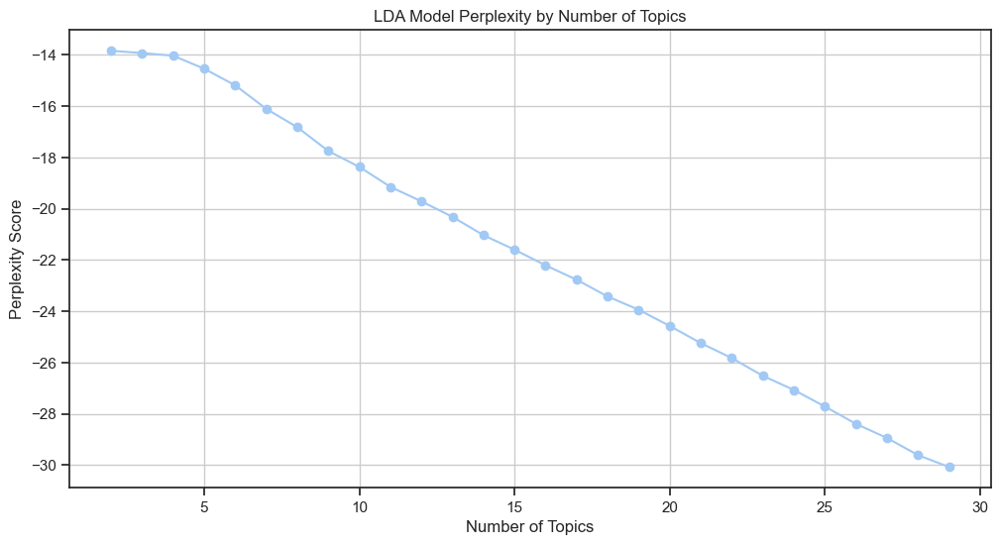

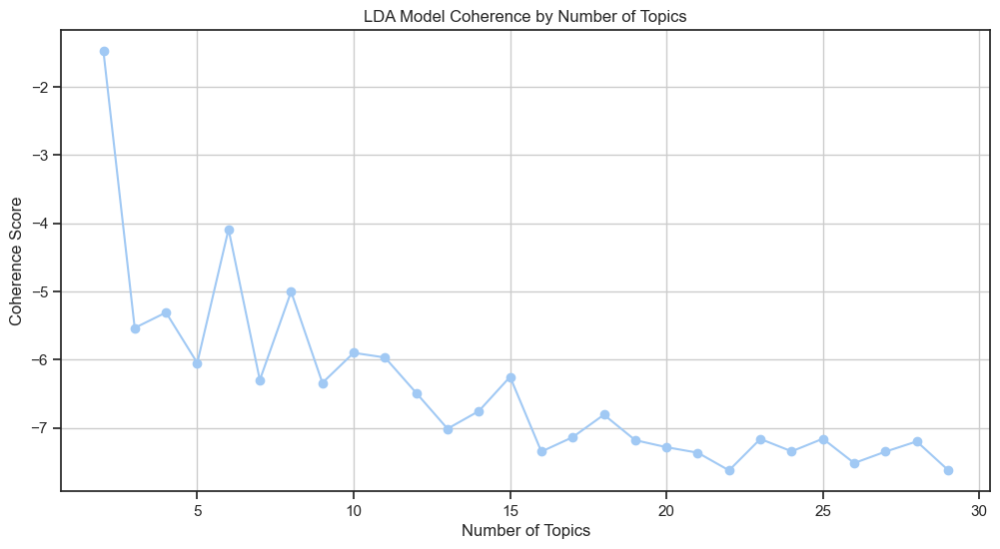

In [93]:
from gensim import corpora, models
from gensim.models.coherencemodel import CoherenceModel


def train_lda_models(dictionary, corpus, texts, start, limit, step):
    """
    Train multiple LDA models, calculate perplexity and coherence for each.

    Parameters:
    - dictionary : Gensim dictionary
    - corpus : Gensim corpus
    - texts : List of input texts
    - start : Start number of topics
    - limit : Max number of topics
    - step : Step size for the number of topics

    Returns:
    - model_list : List of LDA topic models
    - coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    - perplexity_values : Perplexity values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    perplexity_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        # Train LDA model
        model = models.LdaModel(
            corpus,
            num_topics=num_topics,
            id2word=dictionary,
            passes=15,
            random_state=100,
        )
        model_list.append(model)

        # Calculate perplexity and coherence
        perplexity_values.append(model.log_perplexity(corpus))
        coherencemodel = CoherenceModel(
            model=model, texts=texts, dictionary=dictionary, coherence="c_uci"
        )
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values, perplexity_values


# Function to plot the metric values
def plot_metric(x_values, y_values, title, x_label, y_label):
    """
    Function to plot metric values.

    Parameters:
    - x_values : X-axis values (Number of topics)
    - y_values : Y-axis values (Metric values)
    - title : Title of the plot
    - x_label : Label of the x-axis
    - y_label : Label of the y-axis
    """
    plt.figure(figsize=(12, 6))
    plt.plot(x_values, y_values, marker="o")
    plt.title(title)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.grid(True)
    plt.show()


start = 2
limit = 30
step = 1

model_list, coherence_values, perplexity_values = train_lda_models(
    dictionary, corpus, processed_texts, start, limit, step
)

plot_metric(
    list(range(start, limit, step)),
    perplexity_values,
    "LDA Model Perplexity by Number of Topics",
    "Number of Topics",
    "Perplexity Score",
)

plot_metric(
    list(range(start, limit, step)),
    coherence_values,
    "LDA Model Coherence by Number of Topics",
    "Number of Topics",
    "Coherence Score",
)

In [222]:
# Creating a dictionary and corpus for LDA
processed_texts = df_merged["2grams"].tolist()
dictionary = corpora.Dictionary(processed_texts)
corpus = [dictionary.doc2bow(text) for text in processed_texts]
# Training the LDA model
lda_model = models.LdaModel(corpus, num_topics=27, id2word=dictionary, passes=15)

# Displaying the topics
topics = lda_model.print_topics(num_words=8)
for topic in topics:
    print(topic)

(26, '0.005*"total sales" + 0.004*"left join" + 0.004*"right table" + 0.004*"inner join" + 0.004*"two tables" + 0.004*"left table" + 0.004*"outer join" + 0.003*"right join"')
(7, '0.004*"machine learning" + 0.003*"language models" + 0.002*"open source" + 0.002*"real time" + 0.002*"data engineering" + 0.002*"large language" + 0.002*"natural language" + 0.002*"fine tuning"')
(1, '0.002*"apache spark" + 0.002*"postgresql database" + 0.002*"python sql" + 0.001*"learning rate" + 0.001*"machine learning" + 0.001*"database performance" + 0.001*"modify existing" + 0.001*"sql python"')
(13, '0.001*"connection connect" + 0.000*"gunung padang" + 0.000*"chart show" + 0.000*"questions share" + 0.000*"shot learning" + 0.000*"single column" + 0.000*"method see" + 0.000*"org docs"')
(23, '0.010*"data analysis" + 0.006*"data science" + 0.004*"data visualization" + 0.004*"data analytics" + 0.003*"machine learning" + 0.003*"null values" + 0.003*"data analyst" + 0.002*"data manipulation"')
(25, '0.001*"da

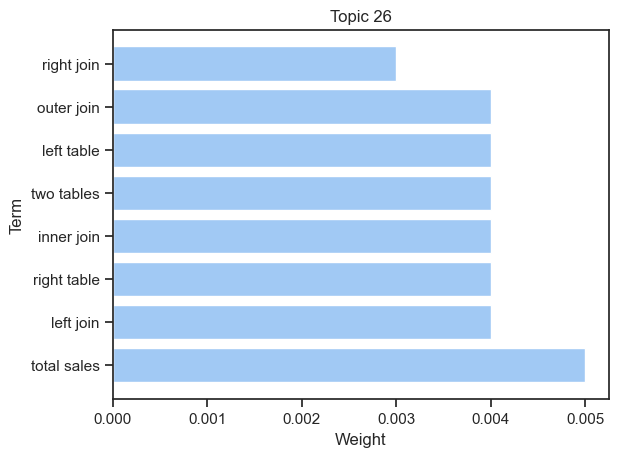

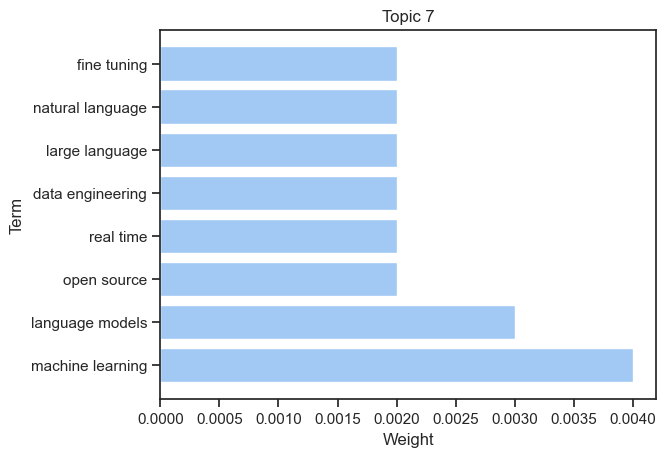

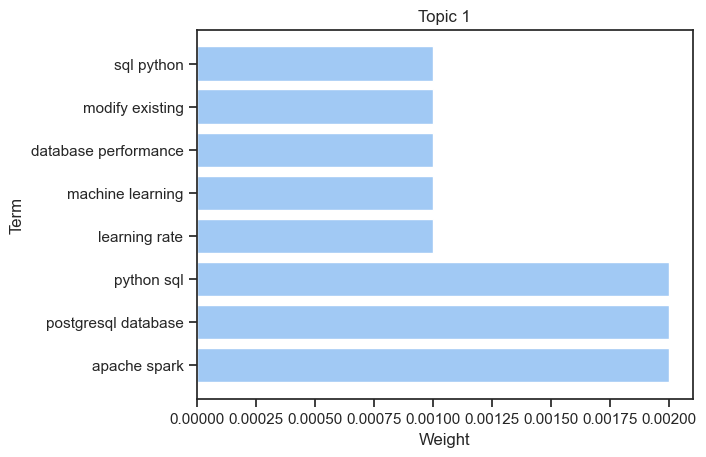

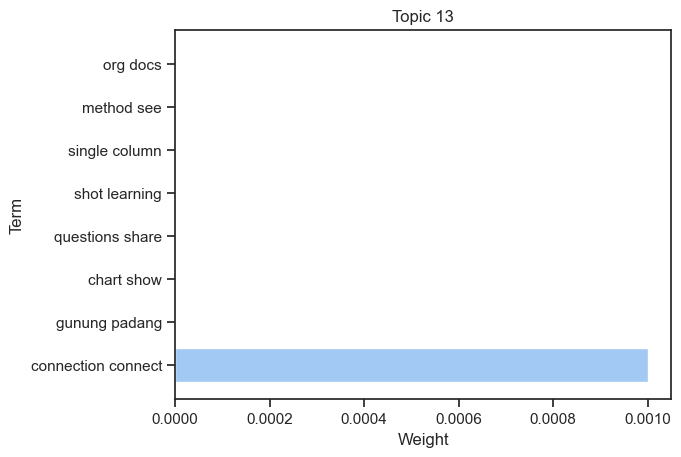

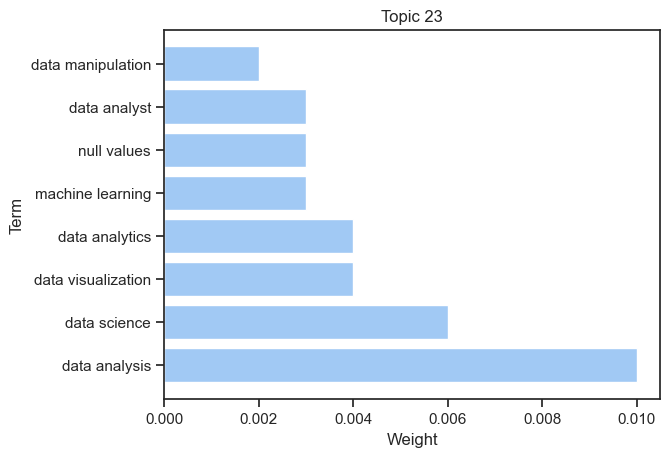

...

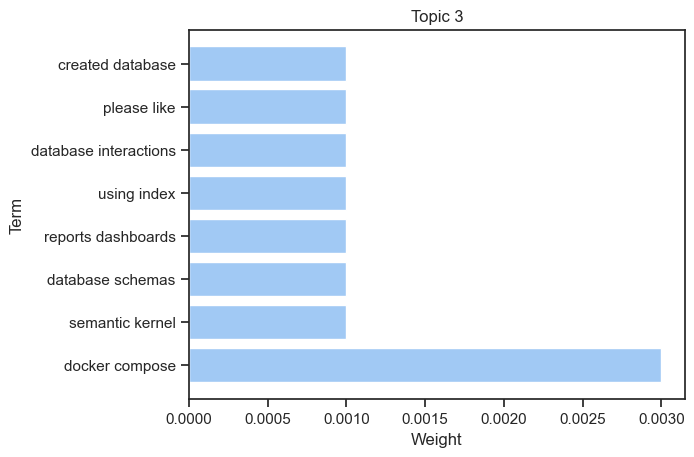

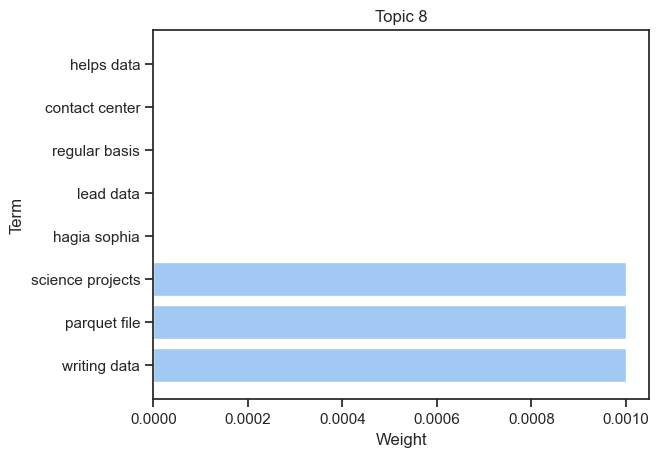

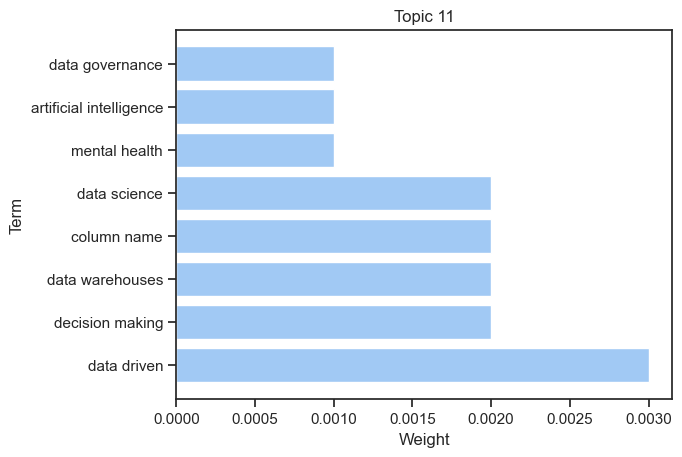

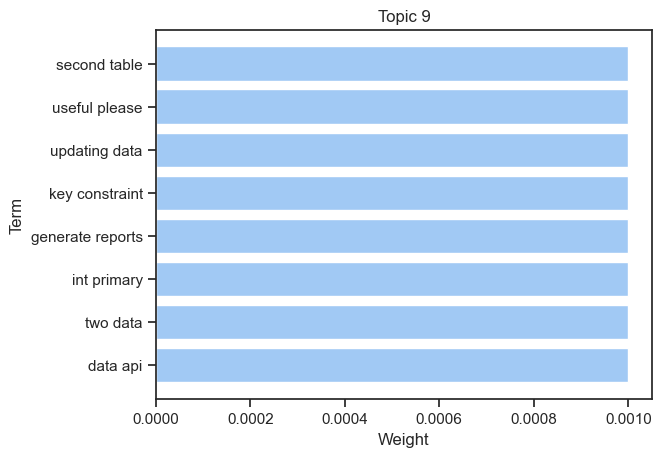

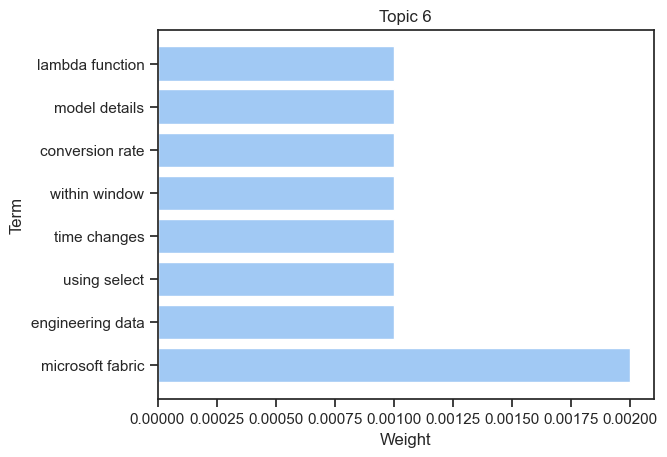

In [223]:
import matplotlib.pyplot as plt

for topic_no, topic_terms in topics:
    terms = [
        term.split("*")[1].replace('"', "").strip() for term in topic_terms.split("+")
    ]
    weights = [float(term.split("*")[0]) for term in topic_terms.split("+")]

    plt.figure()
    plt.title(f"Topic {topic_no}")
    plt.barh(terms, weights)
    plt.xlabel("Weight")
    plt.ylabel("Term")
    plt.show()

In [228]:
filtered_data = []
threshold = 0.000005

for index, tup in topics:
    values = []
    for pair in tup.split(" + "):
        # print(pair)
        coef, word = pair.split("*")
        coef = float(coef.strip())
        word = word.strip('"')
        if coef >= threshold:
            values.append((coef, word))
        else:
            values.append((coef + 0.000001, word))
    filtered_data.append((index, values))

for topic in filtered_data:
    print(topic[1])

[(0.005, 'total sales'), (0.004, 'left join'), (0.004, 'right table'), (0.004, 'inner join'), (0.004, 'two tables'), (0.004, 'left table'), (0.004, 'outer join'), (0.003, 'right join')]
[(0.004, 'machine learning'), (0.003, 'language models'), (0.002, 'open source'), (0.002, 'real time'), (0.002, 'data engineering'), (0.002, 'large language'), (0.002, 'natural language'), (0.002, 'fine tuning')]
[(0.002, 'apache spark'), (0.002, 'postgresql database'), (0.002, 'python sql'), (0.001, 'learning rate'), (0.001, 'machine learning'), (0.001, 'database performance'), (0.001, 'modify existing'), (0.001, 'sql python')]
[(0.001, 'connection connect'), (1e-06, 'gunung padang'), (1e-06, 'chart show'), (1e-06, 'questions share'), (1e-06, 'shot learning'), (1e-06, 'single column'), (1e-06, 'method see'), (1e-06, 'org docs')]
[(0.01, 'data analysis'), (0.006, 'data science'), (0.004, 'data visualization'), (0.004, 'data analytics'), (0.003, 'machine learning'), (0.003, 'null values'), (0.003, 'data 

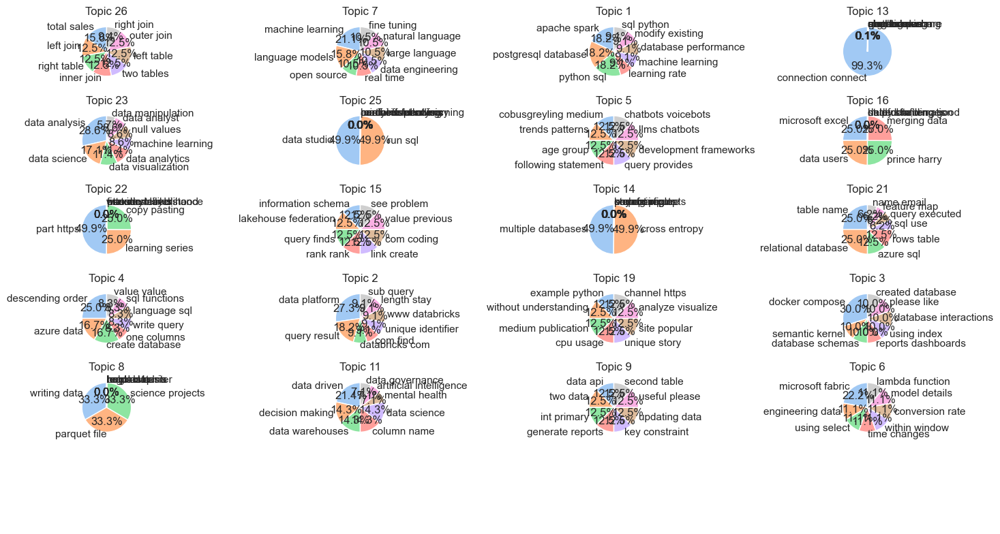

In [229]:
num_rows = 6
num_cols = 4

fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 8))

for i in range(num_rows):
    for j in range(num_cols):
        idx = i * num_cols + j
        if idx < len(filtered_data):
            topic_idx, topic_data = filtered_data[idx]
            coefs, words = zip(*topic_data)
            axs[i, j].pie(coefs, labels=words, autopct="%1.1f%%", startangle=90)
            axs[i, j].set_title(f"Topic {topic_idx}")
        else:
            axs[i, j].axis("off")

plt.tight_layout()
plt.show()

In [ ]:
#!pip install --upgrade pyLDAvis gensim spacy joblib

In [230]:
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis

# Prepare the visualization data
vis_data = gensimvis.prepare(lda_model, corpus, dictionary, sort_topics=False)

# Display the interactive visualization in a Jupyter notebook
pyLDAvis.display(vis_data)

In [233]:
df_merged.head(5)

,tag,month,title,authors,link,categories,claps,responds,catch_phrase,text,Combined_Text,2grams,Combined_Titles,2grams_title
0,conversational-ai,1,New Features Agent Ai Chat Bot By I Need Leads...,Ineedleadsuk,https://medium.com/@ineedleadsuk/new-features-...,"Ai Chat Bot, Ai Chatbot, Conversational AI, Bu...",30.0,0.0,0,"In this article, I will show you some of the ...",new features agent ai chat bot by i need leads...,"[new features, features agent, agent chat, cha...",new features agent ai chat bot by i need leads...,"[new features, features agent, agent chat, cha..."
1,conversational-ai,1,Pheme: An Efficient and Conversational Speech ...,Pankaj Trivedi,https://medium.com/@reachpankaj.trivedi/pheme-...,"Artificial Intelligence, Conversational AI, Vo...",52.0,3.0,Conversation models to the next level,Pheme is a series of efficient and conversati...,pheme: an efficient and conversational speech ...,"[pheme efficient, efficient conversational, co...",pheme: an efficient and conversational speech ...,"[pheme efficient, efficient conversational, co..."
2,conversational-ai,1,How to Transform Frontline Recruitment With an...,Juan Ben,https://medium.com/cloudapper-ai-for-ukg/how-t...,"Frontline Worker, Workforce Management, Ai In ...",37.0,0.0,0,Think about it — who knows your company cultu...,how to transform frontline recruitment with an...,"[transform frontline, frontline recruitment, r...",how to transform frontline recruitment with an...,"[transform frontline, frontline recruitment, r..."
3,conversational-ai,1,How to Handle High-Volume Frontline Hiring Wit...,Juan Ben,https://medium.com/cloudapper-ai-for-ukg/how-t...,"Talent Acquisition, Workforce Management, Conv...",30.0,0.0,0,"So, why is there a constant need for an influ...",how to handle high-volume frontline hiring wit...,"[handle high, high volume, volume frontline, f...",how to handle high-volume frontline hiring wit...,"[handle high, high volume, volume frontline, f..."
4,conversational-ai,1,MultiHop-RAG,Cobus Greyling,https://medium.com/@cobusgreyling/multihop-rag...,"AI, Artificial Intelligence, Machine Learning,...",435.0,3.0,A recent direction in RAG architecture is esta...,Considering the development of the Large Lang...,multihop-rag a recent direction in rag archite...,"[multihop rag, rag recent, recent direction, d...",multihop-rag a recent direction in rag archite...,"[multihop rag, rag recent, recent direction, d..."


In [240]:
topics

[(26,
  '0.005*"total sales" + 0.004*"left join" + 0.004*"right table" + 0.004*"inner join" + 0.004*"two tables" + 0.004*"left table" + 0.004*"outer join" + 0.003*"right join"'),
 (7,
  '0.004*"machine learning" + 0.003*"language models" + 0.002*"open source" + 0.002*"real time" + 0.002*"data engineering" + 0.002*"large language" + 0.002*"natural language" + 0.002*"fine tuning"'),
 (1,
  '0.002*"apache spark" + 0.002*"postgresql database" + 0.002*"python sql" + 0.001*"learning rate" + 0.001*"machine learning" + 0.001*"database performance" + 0.001*"modify existing" + 0.001*"sql python"'),
 (13,
  '0.001*"connection connect" + 0.000*"gunung padang" + 0.000*"chart show" + 0.000*"questions share" + 0.000*"shot learning" + 0.000*"single column" + 0.000*"method see" + 0.000*"org docs"'),
 (23,
  '0.010*"data analysis" + 0.006*"data science" + 0.004*"data visualization" + 0.004*"data analytics" + 0.003*"machine learning" + 0.003*"null values" + 0.003*"data analyst" + 0.002*"data manipulation

In [245]:
topics_dict = {}
threshold = 0.000005

for index, tup in topics:
    ngrams = []
    for pair in tup.split(" + "):
        # print(pair)
        coef, word = pair.split("*")
        # print(word)
        coef = float(coef.strip())
        word = word.strip('"')
        ngrams.append(word)
    topics_dict[index] = ngrams

topics_dict

{26: ['total sales',
  'left join',
  'right table',
  'inner join',
  'two tables',
  'left table',
  'outer join',
  'right join'],
 7: ['machine learning',
  'language models',
  'open source',
  'real time',
  'data engineering',
  'large language',
  'natural language',
  'fine tuning'],
 1: ['apache spark',
  'postgresql database',
  'python sql',
  'learning rate',
  'machine learning',
  'database performance',
  'modify existing',
  'sql python'],
 13: ['connection connect',
  'gunung padang',
  'chart show',
  'questions share',
  'shot learning',
  'single column',
  'method see',
  'org docs'],
 23: ['data analysis',
  'data science',
  'data visualization',
  'data analytics',
  'machine learning',
  'null values',
  'data analyst',
  'data manipulation'],
 25: ['data studio',
  'run sql',
  'analysis following',
  'cardi offset',
  'reinforcement learning',
  'partial dependency',
  'business analysis',
  'machine learning'],
 5: ['cobusgreyling medium',
  'trends pattern

In [247]:
filtered_row = df_merged.copy()


# Function to map 2grams to topics
def map_topics(row):
    found_topics = []
    for topic, words in topics_dict.items():
        for word in words:
            if any(word in grams for grams in row["2grams"]):
                found_topics.append(topic)
    return found_topics if found_topics else None


# Apply the function to create the new 'topics' column
filtered_row["topics"] = filtered_row.apply(map_topics, axis=1)

display(filtered_row)

,tag,month,title,authors,link,categories,claps,responds,catch_phrase,text,Combined_Text,2grams,Combined_Titles,2grams_title,topics
0,conversational-ai,1,New Features Agent Ai Chat Bot By I Need Leads...,Ineedleadsuk,https://medium.com/@ineedleadsuk/new-features-...,"Ai Chat Bot, Ai Chatbot, Conversational AI, Bu...",30.0,0.0,0,"In this article, I will show you some of the ...",new features agent ai chat bot by i need leads...,"[new features, features agent, agent chat, cha...",new features agent ai chat bot by i need leads...,"[new features, features agent, agent chat, cha...",None
1,conversational-ai,1,Pheme: An Efficient and Conversational Speech ...,Pankaj Trivedi,https://medium.com/@reachpankaj.trivedi/pheme-...,"Artificial Intelligence, Conversational AI, Vo...",52.0,3.0,Conversation models to the next level,Pheme is a series of efficient and conversati...,pheme: an efficient and conversational speech ...,"[pheme efficient, efficient conversational, co...",pheme: an efficient and conversational speech ...,"[pheme efficient, efficient conversational, co...",[7]
2,conversational-ai,1,How to Transform Frontline Recruitment With an...,Juan Ben,https://medium.com/cloudapper-ai-for-ukg/how-t...,"Frontline Worker, Workforce Management, Ai In ...",37.0,0.0,0,Think about it — who knows your company cultu...,how to transform frontline recruitment with an...,"[transform frontline, frontline recruitment, r...",how to transform frontline recruitment with an...,"[transform frontline, frontline recruitment, r...",None
3,conversational-ai,1,How to Handle High-Volume Frontline Hiring Wit...,Juan Ben,https://medium.com/cloudapper-ai-for-ukg/how-t...,"Talent Acquisition, Workforce Management, Conv...",30.0,0.0,0,"So, why is there a constant need for an influ...",how to handle high-volume frontline hiring wit...,"[handle high, high volume, volume frontline, f...",how to handle high-volume frontline hiring wit...,"[handle high, high volume, volume frontline, f...",[11]
4,conversational-ai,1,MultiHop-RAG,Cobus Greyling,https://medium.com/@cobusgreyling/multihop-rag...,"AI, Artificial Intelligence, Machine Learning,...",435.0,3.0,A recent direction in RAG architecture is esta...,Considering the development of the Large Lang...,multihop-rag a recent direction in rag archite...,"[multihop rag, rag recent, recent direction, d...",multihop-rag a recent direction in rag archite...,"[multihop rag, rag recent, recent direction, d...","[7, 7, 5, 5, 5, 5]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11879,sql,2,8 Macro Steps for SQL Database Design,CHAIRI Chaimae,https://medium.com/@chaimae-chairi/8-macro-ste...,"Sql, Database Design, Erd, Normalization, Data...",36.0,0.0,0,"To proceed with creating a good design, there...",8 macro steps for sql database design 0 to pr...,"[macro steps, steps sql, sql database, databas...",8 macro steps for sql database design 0,"[macro steps, steps sql, sql database, databas...",None
11881,sql,2,Select * From Table To JSON,Rajan Sahu,https://medium.com/@rajansahu713/select-from-t...,"Sql, Database, Data, Data Engineering, Web Dev...",17.0,1.0,1. to_json,"In this blog, we are going to discuss all the...",select * from table to json 1. to_json in thi...,"[select table, table json, json json, json blo...",select * from table to json 1. to_json,"[select table, table json, json json]",[11]
11883,sql,2,How did we manage our BI datawarehouse migrati...,"Pierre Munhoz, Corentin Flacher, Thales Loiola",https://medium.com/towardsdev/how-did-we-manag...,"Dbt, Snowflake, Python, Data, Sql",7.0,0.0,DAG issues,Building a new data warehouse may seem like a...,how did we manage our bi datawarehouse migrati...,"[manage datawarehouse, datawarehouse migration...",how did we manage our bi datawarehouse migrati...,"[manage datawarehouse, datawarehouse migration...","[26, 25, 4, 11]"
11886,sql,2,Choosing Sql or NoSql database in Microservices,Chaitanya (Chey) Penmetsa,https://medium.com/codenx/choosing-sql-or-nosq...,"Sq

In [248]:
filtered_row = filtered_row.dropna()
filtered_row

,tag,month,title,authors,link,categories,claps,responds,catch_phrase,text,Combined_Text,2grams,Combined_Titles,2grams_title,topics
1,conversational-ai,1,Pheme: An Efficient and Conversational Speech ...,Pankaj Trivedi,https://medium.com/@reachpankaj.trivedi/pheme-...,"Artificial Intelligence, Conversational AI, Vo...",52.0,3.0,Conversation models to the next level,Pheme is a series of efficient and conversati...,pheme: an efficient and conversational speech ...,"[pheme efficient, efficient conversational, co...",pheme: an efficient and conversational speech ...,"[pheme efficient, efficient conversational, co...",[7]
3,conversational-ai,1,How to Handle High-Volume Frontline Hiring Wit...,Juan Ben,https://medium.com/cloudapper-ai-for-ukg/how-t...,"Talent Acquisition, Workforce Management, Conv...",30.0,0.0,0,"So, why is there a constant need for an influ...",how to handle high-volume frontline hiring wit...,"[handle high, high volume, volume frontline, f...",how to handle high-volume frontline hiring wit...,"[handle high, high volume, volume frontline, f...",[11]
4,conversational-ai,1,MultiHop-RAG,Cobus Greyling,https://medium.com/@cobusgreyling/multihop-rag...,"AI, Artificial Intelligence, Machine Learning,...",435.0,3.0,A recent direction in RAG architecture is esta...,Considering the development of the Large Lang...,multihop-rag a recent direction in rag archite...,"[multihop rag, rag recent, recent direction, d...",multihop-rag a recent direction in rag archite...,"[multihop rag, rag recent, recent direction, d...","[7, 7, 5, 5, 5, 5]"
5,conversational-ai,1,Agentic RAG With LlamaIndex,Cobus Greyling,https://medium.com/llamaindex-blog/agentic-rag...,"AI, Artificial Intelligence, Large Language Mo...",630.0,3.0,The topic of Agentic RAG explores how agents c...,"Considering the architecture below, it is evi...",agentic rag with llamaindex the topic of agent...,"[agentic rag, rag llamaindex, llamaindex topic...",agentic rag with llamaindex the topic of agent...,"[agentic rag, rag llamaindex, llamaindex topic...","[7, 7, 7, 5, 5, 5, 5]"
6,conversational-ai,1,‘Home Is Where The Hyper-Personalization Is’. ...,intive,https://medium.com/@intive/home-is-where-the-h...,"Intive, AI, Smart Home, Conversational AI",30.0,0.0,"By Felix Rothmund, Director of Artificial Inte...",The digital age has opened up countless possi...,‘home is where the hyper-personalization is’. ...,"[home hyper, hyper personalization, personaliz...",‘home is where the hyper-personalization is’. ...,"[home hyper, hyper personalization, personaliz...","[7, 11]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11875,sql,2,Exploring Joins with SQL and Python,Bruno Nwagbo,https://medium.com/stackademic/exploring-joins...,"Sql, Python, Pandas",3.0,1.0,0,SQL and python are incredible languages to ex...,exploring joins with sql and python 0 sql and...,"[exploring joins, joins sql, sql python, pytho...",exploring joins with sql and python 0,"[exploring joins, joins sql, sql python]","[26, 26, 26, 26, 26, 26, 1, 1, 21]"
11881,sql,2,Select * From Table To JSON,Rajan Sahu,https://medium.com/@rajansahu713/select-from-t...,"Sql, Database, Data, Data Engineering, Web Dev...",17.0,1.0,1. to_json,"In this blog, we are going to discuss all the...",select * from table to json 1. to_json in thi...,"[select table, table json, json json, json blo...",select * from table to json 1. to_json,"[select table, table json, json json]",[11]
11883,sql,2,How did we manage our BI datawarehouse migrati...,"Pierre Munhoz, Corentin Flacher, Thales Loiola",https://medium.com/towardsdev/how-did-we-manag...,"Dbt, Snowflake, Python, Data, Sql",7.0,0.0,DAG issues,Building a new data warehouse may seem like a...,how did we manage our bi datawarehouse migrati...,"[manage datawarehouse, datawarehouse migration...",how did we manage our bi datawarehouse migrati...,"[manage datawarehouse, datawarehouse migration...","[26, 25, 4, 11]"
11886,sql,2,Choosing Sql or NoSql database in Microservices,Ch

In [183]:
#### Manipulating dataset to link topics to claps

In [252]:
# Convert lists in the DataFrame to tuples
filtered_row["2grams"] = filtered_row["2grams"].apply(lambda x: tuple(x))
filtered_row["2grams_title"] = filtered_row["2grams_title"].apply(lambda x: tuple(x))


# Convert tuples back to lists if needed
# filtered_row['2grams'] = filtered_row['2grams'].apply(list)
# filtered_row['2grams_title'] = filtered_row['2grams_title'].apply(list)

In [253]:
filtered_row_exploded = filtered_row.copy()
filtered_row_exploded = filtered_row_exploded.explode("topics")
filtered_row_exploded = filtered_row_exploded.drop_duplicates()
filtered_row_exploded

,tag,month,title,authors,link,categories,claps,responds,catch_phrase,text,Combined_Text,2grams,Combined_Titles,2grams_title,topics
1,conversational-ai,1,Pheme: An Efficient and Conversational Speech ...,Pankaj Trivedi,https://medium.com/@reachpankaj.trivedi/pheme-...,"Artificial Intelligence, Conversational AI, Vo...",52.0,3.0,Conversation models to the next level,Pheme is a series of efficient and conversati...,pheme: an efficient and conversational speech ...,"(pheme efficient, efficient conversational, co...",pheme: an efficient and conversational speech ...,"(pheme efficient, efficient conversational, co...",7
3,conversational-ai,1,How to Handle High-Volume Frontline Hiring Wit...,Juan Ben,https://medium.com/cloudapper-ai-for-ukg/how-t...,"Talent Acquisition, Workforce Management, Conv...",30.0,0.0,0,"So, why is there a constant need for an influ...",how to handle high-volume frontline hiring wit...,"(handle high, high volume, volume frontline, f...",how to handle high-volume frontline hiring wit...,"(handle high, high volume, volume frontline, f...",11
4,conversational-ai,1,MultiHop-RAG,Cobus Greyling,https://medium.com/@cobusgreyling/multihop-rag...,"AI, Artificial Intelligence, Machine Learning,...",435.0,3.0,A recent direction in RAG architecture is esta...,Considering the development of the Large Lang...,multihop-rag a recent direction in rag archite...,"(multihop rag, rag recent, recent direction, d...",multihop-rag a recent direction in rag archite...,"(multihop rag, rag recent, recent direction, d...",7
4,conversational-ai,1,MultiHop-RAG,Cobus Greyling,https://medium.com/@cobusgreyling/multihop-rag...,"AI, Artificial Intelligence, Machine Learning,...",435.0,3.0,A recent direction in RAG architecture is esta...,Considering the development of the Large Lang...,multihop-rag a recent direction in rag archite...,"(multihop rag, rag recent, recent direction, d...",multihop-rag a recent direction in rag archite...,"(multihop rag, rag recent, recent direction, d...",5
5,conversational-ai,1,Agentic RAG With LlamaIndex,Cobus Greyling,https://medium.com/llamaindex-blog/agentic-rag...,"AI, Artificial Intelligence, Large Language Mo...",630.0,3.0,The topic of Agentic RAG explores how agents c...,"Considering the architecture below, it is evi...",agentic rag with llamaindex the topic of agent...,"(agentic rag, rag llamaindex, llamaindex topic...",agentic rag with llamaindex the topic of agent...,"(agentic rag, rag llamaindex, llamaindex topic...",7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11886,sql,2,Choosing Sql or NoSql database in Microservices,Chaitanya (Chey) Penmetsa,https://medium.com/codenx/choosing-sql-or-nosq...,"Sql Vs Nosql, Sql, NoSQL, Microservices, Design",4.0,0.0,ACID and BASE databases explained 👨‍🏫,SQL and NoSQL databases diverge in terms of t...,choosing sql or nosql database in microservice...,"(choosing sql, sql nosql, nosql database, data...",choosing sql or nosql database in microservice...,"(choosing sql, sql nosql, nosql database, data...",23
11886,sql,2,Choosing Sql or NoSql database in Microservices,Chaitanya (Chey) Penmetsa,https://medium.com/codenx/choosing-sql-or-nosq...,"Sql Vs Nosql, Sql, NoSQL, Microservices, Design",4.0,0.0,ACID and BASE databases explained 👨‍🏫,SQL and NoSQL databases diverge in terms of t...,choosing sql or nosql database in microservice...,"(choosing sql, sql nosql, nosql database, data...",choosing sql or nosql database in microservice...,"(choosing sql, sql nosql, nosql database, data...",21
11886,sql,2,Choosing Sql or NoSql database in Microservices,Chaitanya (Chey) Penmetsa,https://medium.com/codenx/choosing-sql-or-nosq...,"Sql Vs Nosql, Sql, NoSQL, Microservices, Design",4.0,0.0,ACID and BASE databases explained 👨‍🏫,SQL and NoSQL databases diverge in terms of t...,choosing sql or nosql database in microservice...,"(choosing sql, sql nosql, nosql database, data...",choosing sql or nosql database in microservice...,"(choosing sql, sql nosql, nosql da

In [254]:
filtered_row_exploded.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15127 entries, 1 to 11891
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   tag              15127 non-null  category
 1   month            15127 non-null  category
 2   title            15127 non-null  object  
 3   authors          15127 non-null  category
 4   link             15127 non-null  object  
 5   categories       15127 non-null  category
 6   claps            15127 non-null  float64 
 7   responds         15127 non-null  float64 
 8   catch_phrase     15127 non-null  object  
 9   text             15127 non-null  object  
 10  Combined_Text    15127 non-null  object  
 11  2grams           15127 non-null  object  
 12  Combined_Titles  15127 non-null  object  
 13  2grams_title     15127 non-null  object  
 14  topics           15127 non-null  object  
dtypes: category(4), float64(2), object(9)
memory usage: 2.0+ MB


<Axes: xlabel='topics'>

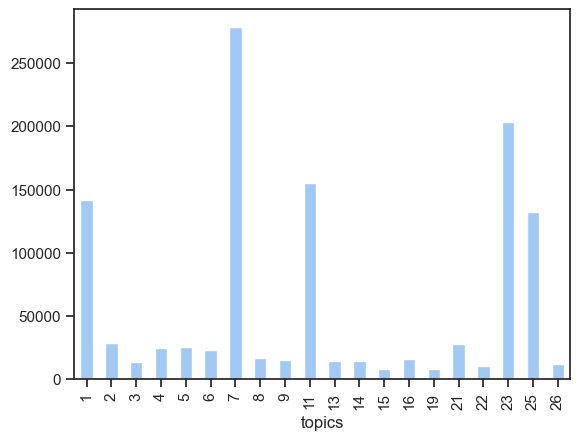

In [256]:
filtered_row_exploded.groupby("topics")["claps"].sum().plot(kind="bar")